# Business understanding


## Background


In this project i will use various machine learning models to attempt classification of dog breeds using the dog breed identification dataset on kaggle which can be found here: https://www.kaggle.com/competitions/dog-breed-identification/data


The dataset consists of 120 dog breeds and each image has a filename that is its unique id.


I will be following a CRISP-DM methodology which can be found here: http://www.statoo.com/CRISP-DM.pdf



Some generic tasks of crisp-dm won't be included in the notebook as they are already included in my TMA document, some generic tasks on business understanding are skipped over entirely as they were questions in the TMA that were closly linked. Most of the practical generic tasks will be included, and will have headings.

## Set-up work environment

In [1]:
# Imports 

import tensorflow as tf  
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import sklearn
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import joblib
import math
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import RandomizedSearchCV
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from scipy.stats import randint
import time
import tensorflow_hub as hub
import pickle
import json
from tensorflow.keras.callbacks import EarlyStopping
import functools

from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
from tensorflow.keras.callbacks import TensorBoard
import shutil
import os 

In [2]:
# Constants

RANDOM_SEED = 42

BATCH_SIZE = 32

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

INPUT_SHAPE = [None, 224, 224, 3] # batch, height, width, colour channels

NUM_CLASSES = 120



In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


Import the data, i'm using https://colab.research.google.com/notebooks/io.ipynb as a guide.

Now i've mounted the drive i have to upload the .zip file and extract it here. I use a chrome extension called grepper, when you google coding questions it provides code snippets it suggested:

!unzip path_to_file.zip -d path_to_directory

So I'm going to try that.

In [4]:
# !unzip "data/dog-breed-identification" -d "data/"   #only have to run this once

Now I'm going to see what the .zip contents look like and view how many files of each set there are and make sure everything matches the kaggle dataset.

# Data understanding


## Collect Initial Data

In [5]:
files = os.listdir('C:\\Users\\Eavle\\Downloads\\dog-breed-identification')
print(files)

['labels.csv', 'my_random_forest.joblib', 'sample_submission.csv', 'test', 'train']


In [6]:
TRAIN_PATH = "train"
TEST_PATH = "test"
ROOT_PATH = "C:\\Users\\Eavle\\Downloads\\dog-breed-identification"

train = (len(os.listdir(os.path.join(ROOT_PATH, TRAIN_PATH))))
test = (len(os.listdir(os.path.join(ROOT_PATH, TEST_PATH))))

print("There are Train images {} and {} Test images.".format(train, test))

There are Train images 10222 and 10357 Test images.


Okay, thats 10.2k train images and 10.3k test images, now let's see if the labels.csv matches the data so we know we have uploaded correctly, then we can take a look at some of the images. 

## Describe the data

In [7]:
csv_labels = pd.read_csv("C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\labels.csv")

csv_labels.describe() 

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


Right, so we have a count row that shows 10222 id's to match the images, and a unique row with 10222 ids and 120 breeds. 

In [8]:
csv_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [9]:
csv_labels.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [10]:
csv_labels.tail(10)

,id,breed
10212,ffc532991d3cd7880d27a449ed1c4770,tibetan_terrier
10213,ffca1c97cea5fada05b8646998a5b788,english_foxhound
10214,ffcb610e811817766085054616551f9c,briard
10215,ffcde16e7da0872c357fbc7e2168c05f,airedale
10216,ffcffab7e4beef9a9b8076ef2ca51909,samoyed
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher
10221,fff43b07992508bc822f33d8ffd902ae,chesapeake_bay_retriever


Everything seems to be there, the id's in the csv match the file length in the train directory. I'm now going to explore and verify the data

## Data exploration

In [11]:
breeds = csv_labels["breed"].value_counts()
print(breeds)

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64


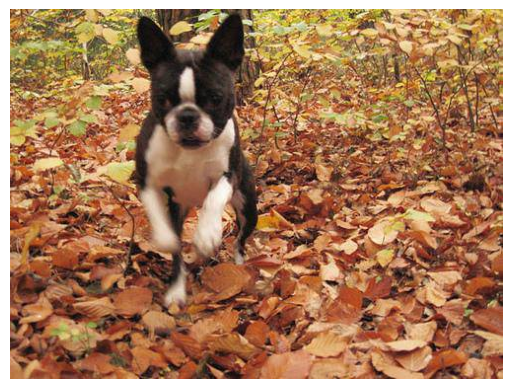

In [12]:
boston_bull = 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\000bec180eb18c7604dcecc8fe0dba07.jpg' #lets see if its a boston bull 

img = mpimg.imread(boston_bull)
plt.imshow(img)
plt.axis("off")
plt.show()


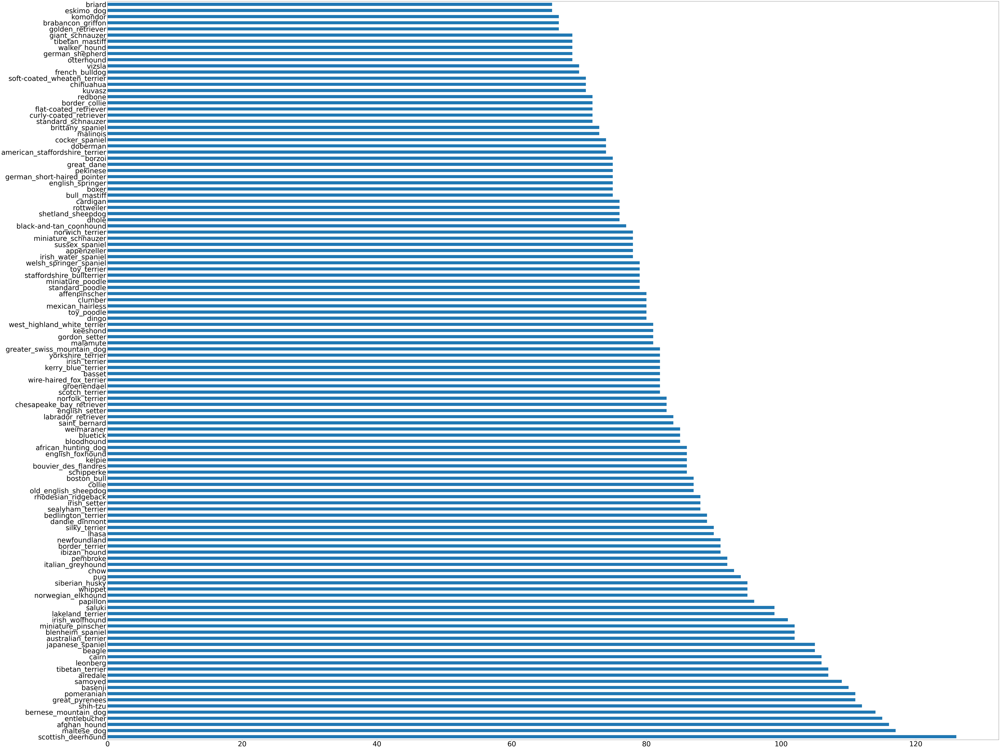

In [13]:
plt.figure(figsize=(80, 60)) # Adjust the figure size as needed
breeds.plot(kind='barh', fontsize=40)
plt.tight_layout()
plt.show()

Right, so there is roughly 70-80+ images for each breed with scottish_deerhound having the most at 126 images and briard having the least at 60 images.

## Verify data quality

So far, all the data seems to be there, we've looked at an image and viewed how many images of each breed there are. The data seems complete, and doesn't seem to contain any errors. 

Below I'm going to create a list of file paths to each image along with there id's this will help me scale the data, i can also verify its quality by comparing it to the training data.

In [14]:
# Load CSV file and get breed labels
labels = csv_labels["breed"].to_numpy()

ids = {}
for filename in os.listdir('C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train'):  #this opens my drive you'd have to replace this with your train folder in your drive.
    if filename.endswith(".jpg"):
        id = filename[:-4] # this removes the .jpg
        ids[id] = filename

# Create list of filenames in the same order as the labels
filenames = ["C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\" + ids[id] for id in csv_labels["id"].tolist() if id in ids]

In [15]:
print("Number of filenames: ", (len(filenames)))
print("Number of training data: ", (len(os.listdir("C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\"))))

if len(filenames) == len(os.listdir("C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train")):
  print("They match")
else:
    print("they don't match")

Number of filenames:  10222
Number of training data:  10222
They match


In [16]:
filenames[:10]

['C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\000bec180eb18c7604dcecc8fe0dba07.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\001cdf01b096e06d78e9e5112d419397.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\002211c81b498ef88e1b40b9abf84e1d.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\002a283a315af96eaea0e28e7163b21b.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\0042188c8

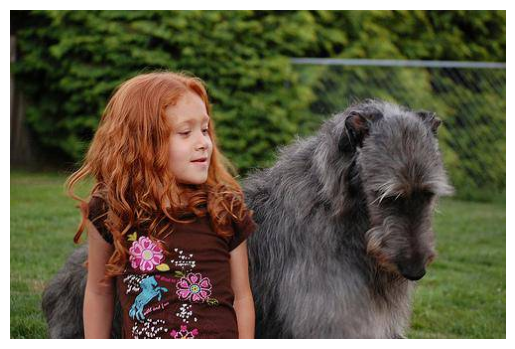

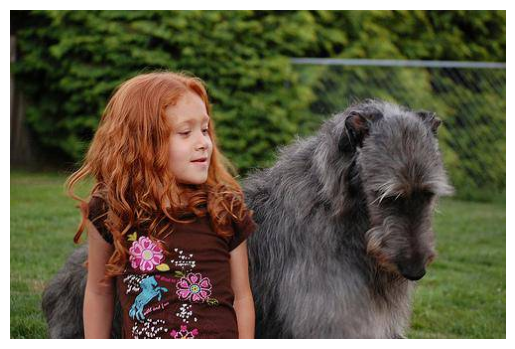

In [17]:
#Lets check an image now to make sure they match

deerhound = filenames[9]

img = mpimg.imread(deerhound)
plt.imshow(img)
plt.axis("off")
plt.show()


deerhound1 = "C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\0042188c895a2f14ef64a918ed9c7b64.jpg"

img = mpimg.imread(deerhound1)
plt.imshow(img)
plt.axis("off")
plt.show()


The extra steps are to verify the data, it helps us check there wasn't any extraction errors or incomplete data.

# Data preparation

## Select, Construct And Format Data

In this stage i will be selecting the data I'm going to be using, I will use a subset of the data to train with first, and I'm going to prepare the data to be used with a random forest first, in data science data preparation sometimes differs for different machine learning algorithms. The reason i didn't include data cleaning from the CRISP-DM was because our data didn't need cleaning, there was no missing data or errors. 

In [18]:
print("The labels are of type: ", type(labels))
print("The filenames are of type: ", type(filenames))

The labels are of type:  <class 'numpy.ndarray'>
The filenames are of type:  <class 'list'>


Because I'm going to be using a random forest first to get a base model, in order to produce a half decent result I'm going to use feature extraction using a transfer learning model, I've chosen resnet50 for this because its a fast model with high accuracy.

Because a random forest can use categorical labels, I won't need to use one-hot-encoding on the labels, however later on when i use neural networks for classification i will. one-hot-encoding isn't needed for feature extraction using a pre-trained model but it is used for multi-class classification with neural networks. 

I'm not using a scaler either because this step is taken care of when building the function for the feature extraction in the preprocess_input function

https://www.programcreek.com/python/example/89223/keras.preprocessing.image.load_img

I'm going to test this on 30% of the data first. 

In [19]:
print(len(filenames))
print(len(labels))

10222
10222


In [20]:
FILE = 10156 * 30 
print("30% of filenames is, ", FILE // 100)  #uses floor division to find percentage

30% of filenames is,  3046


In [21]:
thirtyfile = filenames[:3046] #this is my x and y values. 
thirtylab = labels[:3046]

In [22]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

This is something new i discovered if i create a boolean that checks if the label is equal to each unique breed i get a list of boolean values where each element shows if the corresponding label is equal to each breed.

this makes it easier for us to represent the labels as a binary vector

In [133]:
image_list = []
for filepath in thirtyfile:
   img = load_img(filepath, target_size=(224, 224))   #224, 224 is important because its the size VGG16 uses
   img_array = img_to_array(img)
   img_array = np.expand_dims(img_array, axis=0)   #this is section is image preprocessing
   img_preprocessed = preprocess_input(img_array)
   image_list.append(img_preprocessed)
images = np.vstack(image_list)  # this stacks arrays in sequence vertically

In [136]:
base_model = VGG16(weights='imagenet', include_top=True, pooling='avg')

In [32]:
input_tensor = base_model.input
output_tensor = base_model.get_layer('fc1').output

model = Model(inputs=input_tensor, outputs=output_tensor)

for layer in model.layers[:15]:
    layer.trainable = False

num_images = len(images)

predicted_features = []

for start_idx in range(0, num_images, BATCH_SIZE):
    end_idx = min(start_idx + BATCH_SIZE, num_images)


    batch_images = images[start_idx:end_idx]


    batch_features = model.predict(batch_images)


    predicted_features.extend(batch_features)


features = np.array(predicted_features)


In [ ]:
np.save('C:\\Users\\Eavle\\Downloads\\features.npy', features)

In [137]:
features = np.load('C:\\Users\\Eavle\\Downloads\\features.npy')

# Modelling Random Forests

In [138]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [144]:
#split the data in training, testing and validation data with a train size = 80%

X_train, X_valid, y_train, y_valid = train_test_split(features, thirtylab, train_size=0.8)

In [145]:
start = time.time() #create starttime variable

clf = RandomForestClassifier(n_estimators=500, random_state=RANDOM_SEED)
clf.fit(X_train, y_train)

end = time.time()
print("Training took: ", end - start, "Seconds")

Training took:  84.7847170829773 Seconds


In [146]:
with open('random_forest_model.pkl', 'wb') as file:  #save model
    pickle.dump(clf, file)


In [147]:
with open('random_forest_model.pkl', 'rb') as file:  #load model
    rf_model = pickle.load(file)


In [149]:
y_pred = rf_model.predict(X_valid)
print("Accuracy:", accuracy_score(y_valid, y_pred))
print(classification_report(y_valid, y_pred))

Accuracy: 0.6475409836065574
                                precision    recall  f1-score   support

                 affenpinscher       0.00      0.00      0.00         2
                  afghan_hound       0.67      0.80      0.73         5
           african_hunting_dog       0.60      0.75      0.67         4
                      airedale       0.62      1.00      0.77         5
american_staffordshire_terrier       0.00      0.00      0.00         2
                   appenzeller       0.33      0.14      0.20         7
            australian_terrier       0.33      0.25      0.29         4
                       basenji       0.62      0.50      0.56        10
                        basset       0.67      0.50      0.57         8
                        beagle       0.67      0.67      0.67         6
            bedlington_terrier       0.80      0.89      0.84         9
          bernese_mountain_dog       0.62      1.00      0.77        10
       black-and-tan_coonhound    

C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Okay, so we got 99% accuracy on training, and 67% on the unseen data, so it is performing fairly good for a base model, I'm going to test it with some different hyper parameters now (could use generated hyperparameters like we did in the ML TMA) or randomized cv 

In [40]:
clf1 = RandomForestClassifier(random_state=RANDOM_SEED)

params = {
    'n_estimators': randint(500, 750),
    'max_depth': [None] + list(range(10, 20, 2)),  #default is none
    'min_samples_split': randint(2, 6),  #default=2
    'bootstrap': [True, False]
}

rscv = RandomizedSearchCV(
    estimator=clf1,
    param_distributions=params,
    n_iter=10,
    cv=3,
    random_state=42,
    n_jobs=-1
)


start = time.time() #create starttime variable

rscv.fit(X_train, y_train)


end = time.time()
print("Training took: ", end - start, "Seconds")


exception calling callback for <Future at 0x254c103a490 state=finished raised TerminatedWorkerError>
Traceback (most recent call last):
  File "C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\joblib\externals\loky\_base.py", line 26, in _invoke_callbacks
    callback(self)
  File "C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\joblib\parallel.py", line 385, in __call__
    self.parallel.dispatch_next()
  File "C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\joblib\parallel.py", line 834, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\joblib\parallel.py", line 901, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\joblib\parallel.py", line 819, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\joblib\_paralle

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.


In [41]:
best_model = rscv.best_estimator_

In [42]:
with open('best_random_forest_model.pkl', 'wb') as file:  #save model
    pickle.dump(best_model, file)

In [43]:
with open('best_random_forest_model.pkl', 'rb') as file:  #load model
    best_model = pickle.load(file)

In [44]:
y_pred = best_model.predict(X_valid)

#Calculate accuracy
accuracy = accuracy_score(y_valid, y_pred)
print(f"Accuracy: {accuracy}")

#Print classification report
report = classification_report(y_valid, y_pred)
print(report)

Accuracy: 0.6426229508196721
                                precision    recall  f1-score   support

                 affenpinscher       0.00      0.00      0.00         0
                  afghan_hound       0.75      1.00      0.86         3
           african_hunting_dog       1.00      1.00      1.00         2
                      airedale       0.50      1.00      0.67         5
american_staffordshire_terrier       0.00      0.00      0.00         1
            australian_terrier       0.33      0.20      0.25         5
                       basenji       0.40      1.00      0.57         4
                        basset       1.00      0.50      0.67         2
                        beagle       0.33      1.00      0.50         1
            bedlington_terrier       0.40      1.00      0.57         2
          bernese_mountain_dog       1.00      1.00      1.00         3
       black-and-tan_coonhound       0.00      0.00      0.00         0
              blenheim_spaniel    

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1

In [45]:
best_model.score(X_train, y_train)

0.9995894909688013

In [46]:
cv_results = rscv.cv_results_

In [47]:
best_params = rscv.best_params_
print(f"Best Hyperparameters: {best_params}")

Best Hyperparameters: {'bootstrap': True, 'max_depth': None, 'min_samples_split': 4, 'n_estimators': 558}


# Building the three cnn's

grab 30% of top classes this time

In [54]:
X_train, X_valid, y_train, y_valid = train_test_split(thirtyfile, thirtylab, train_size=0.8)

In [55]:
def apply_one_hot_encoding(y_train, y_test=False, y_valid=False):
    
    encoder = OneHotEncoder(sparse=False)

    y_train_reshaped = y_train.reshape(-1, 1)
    y_train_encoded = encoder.fit_transform(y_train_reshaped)

    if y_test is not False:
        y_test_reshaped = y_test.reshape(-1, 1)
        y_test_encoded = encoder.transform(y_test_reshaped)
    else:
        y_test_encoded = None

    if y_valid is not False:
        y_valid_reshaped = y_valid.reshape(-1, 1)
        y_valid_encoded = encoder.transform(y_valid_reshaped)
    else:
        y_valid_encoded = None

    if y_valid_encoded is not None and y_test_encoded is not None:
        return y_train_encoded, y_test_encoded, y_valid_encoded
    elif y_test_encoded is not None and y_valid_encoded is None:
        return y_train_encoded, y_test_encoded
    elif y_valid_encoded is not None and y_test_encoded is None:
        return y_train_encoded, y_valid_encoded
    else:
        return y_train_encoded


In [56]:
#onehot encode y values
y_train_encoded, y_valid_encoded = apply_one_hot_encoding(y_train, y_valid)



C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [57]:
y_train_encoded.shape

(2436, 120)

In [58]:
y_train.shape

(2436,)

In [59]:
y_train_encoded.shape

(2436, 120)

In [62]:
def preprocess_image(image_path, label, data_aug=True):
    #Read and preprocess image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [224, 224])
    
    if data_aug:
        #Data augmentation (can add more data aug here)
        image = tf.image.random_flip_left_right(image)
    
    return image, label


def preprocess_datasets(X_train, y_train_encoded, X_valid=False, y_valid_encoded=False, X_test=False, y_test_encoded=False, data_aug=False, BATCH_SIZE=BATCH_SIZE):
    train_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X_train), tf.constant(y_train_encoded)))
    train_dataset = train_dataset.map(lambda x, y: preprocess_image(x, y, data_aug=data_aug))

    train_dataset = train_dataset.shuffle(buffer_size=len(X_train))
    train_dataset = train_dataset.batch(BATCH_SIZE)
    train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)


    if X_valid and y_valid_encoded is not False:
        valid_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X_valid), tf.constant(y_valid_encoded)))
        valid_dataset = valid_dataset.map(lambda x, y: preprocess_image(x, y, data_aug=data_aug))
        valid_dataset = valid_dataset.batch(BATCH_SIZE)
    else:
        valid_dataset = None
    


    if X_test and y_test_encoded is not False:
        test_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X_test), tf.constant(y_test_encoded)))
        test_dataset = test_dataset.map(lambda x, y: preprocess_image(x, y, data_aug=data_aug)) 
        test_dataset = test_dataset.batch(BATCH_SIZE)
    else:
        test_dataset = None
        
    
    if valid_dataset is not None and test_dataset is not None:
        return train_dataset, valid_dataset, test_dataset
    elif valid_dataset is not None and test_dataset is None:
        return train_dataset, valid_dataset
    elif test_dataset is not None and valid_dataset is None:
        return train_dataset, test_dataset
    else:
        return train_dataset





In [63]:
train_dataset, valid_dataset = preprocess_datasets(X_train, y_train_encoded, X_valid, y_valid_encoded)

In [64]:
train_dataset.element_spec, valid_dataset.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.float64, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.float64, name=None)))

lets visualize our data batches

In [65]:
unique_breeds = np.unique(thirtylab)

In [66]:
# Create a function for viewing images in a data batch
def show_15_images(images, labels):
    """
    Displays a plot of 15 images and their labels from a data batch.
    """
    # Set up the figure
    plt.figure(figsize=(12, 8))
    # Add title for the batched dataset images
    plt.suptitle("Batched Dataset Images", fontsize=16)
    # Loop through 15 (for displaying 15 images)
    for i in range(15):
        # Create subplots (3 rows, 5 columns)
        ax = plt.subplot(3, 5, i+1)
        # Display an image
        plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        # Disable axis ticks
        plt.axis('off')
    # Adjust the layout
    plt.tight_layout()
    # Show the plot
    plt.show()

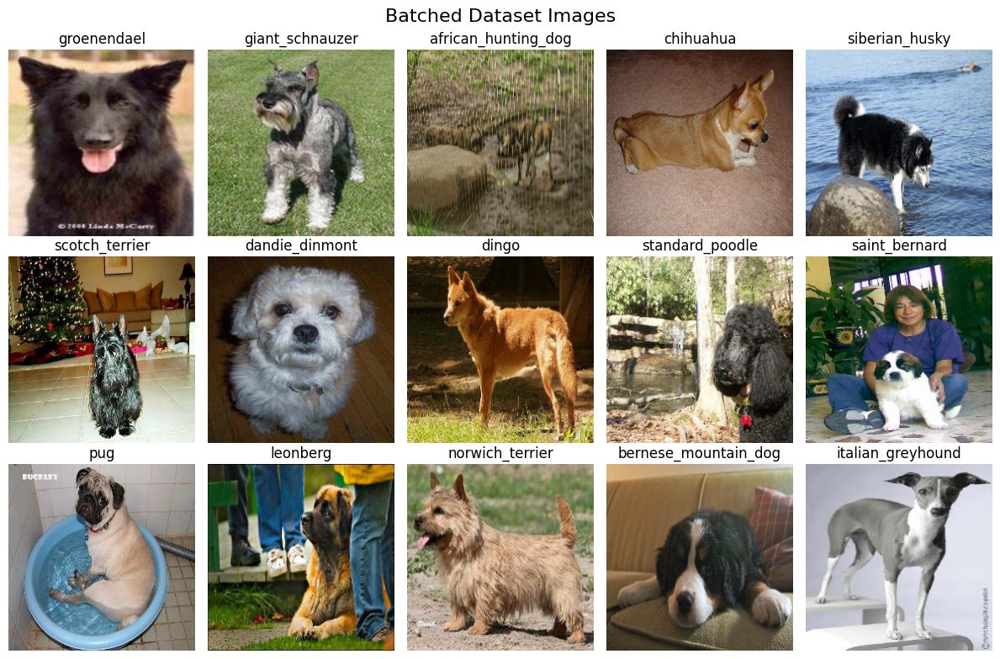

<Figure size 640x480 with 0 Axes>

In [67]:
# Visualize our data
train_images, train_labels = next(train_dataset.as_numpy_iterator())
show_15_images(train_images, train_labels)
plt.tight_layout()

# Create our base model

In [161]:
unique_classes = np.unique(y_train_encoded, axis=0)
print(len(unique_classes))

120


In [162]:
NUM_CLASSES = len(unique_classes)

In [163]:
tf.random.set_seed(RANDOM_SEED) #set random seeds for reproducible results

In [164]:
# Create callbacks so we can comapre models

log_dir = 'logs'  # TensorBoard logs loc
tensorboard_callback = TensorBoard(log_dir=log_dir)

In [165]:
##create model

cnn1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')
])

In [166]:
#Compile model
cnn1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#Print a summary of the model architecture
cnn1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 186624)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                11944000  
_________________________________________________________________
dense_3 (Dense)              (None, 120)              

In [167]:
# Train your CNN model using the batched dataset
history = cnn1.fit(train_dataset, validation_data=valid_dataset, epochs=10, callbacks=[tensorboard_callback])

Epoch 1/10
77/77 [==============================] - 78s 59ms/step - loss: 4.9498 - accuracy: 0.0119 - val_loss: 4.7858 - val_accuracy: 0.0115
Epoch 2/10
77/77 [==============================] - 6s 54ms/step - loss: 4.7670 - accuracy: 0.0181 - val_loss: 4.7869 - val_accuracy: 0.0082
Epoch 3/10
77/77 [==============================] - 6s 53ms/step - loss: 4.5512 - accuracy: 0.0538 - val_loss: 4.8268 - val_accuracy: 0.0164
Epoch 4/10
77/77 [==============================] - 6s 54ms/step - loss: 3.0931 - accuracy: 0.3387 - val_loss: 5.7469 - val_accuracy: 0.0180
Epoch 5/10
77/77 [==============================] - 6s 53ms/step - loss: 0.7336 - accuracy: 0.8477 - val_loss: 8.2242 - val_accuracy: 0.0230
Epoch 6/10
77/77 [==============================] - 6s 53ms/step - loss: 0.1041 - accuracy: 0.9840 - val_loss: 11.2274 - val_accuracy: 0.0148
Epoch 7/10
77/77 [==============================] - 6s 54ms/step - loss: 0.0522 - accuracy: 0.9971 - val_loss: 10.4606 - val_accuracy: 0.0164
Epoch 8/10

In [168]:
# cache results 
cnn1.save('cnn1.h5')

with open('cnn1.json', 'w') as f:
        json.dump(history.history, f)


In [169]:
cnn1 = tf.keras.models.load_model('cnn1.h5')
with open('cnn1.json') as f:
    cnn1_history = json.load(f)


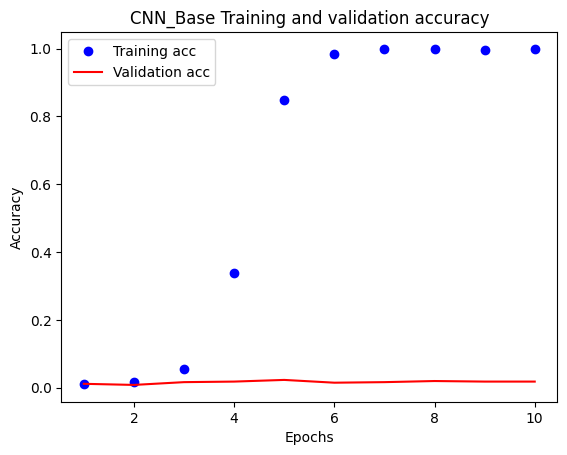

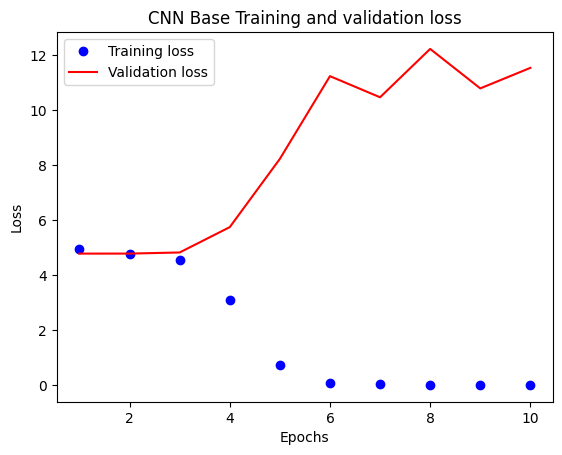

In [170]:
train_acc = cnn1_history['accuracy']
val_acc = cnn1_history['val_accuracy']
train_loss = cnn1_history['loss']
val_loss = cnn1_history['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('CNN_Base Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('CNN Base Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()


Right our model is overfitting, it doesn't generalize at all, so instead of using 30% of the data on all of the classes im going to use only 30% of the data on 20 of the top classes. this will give our model a chance to generalise with the validation data

# CNN with Data Augmentation

## How data augmentation works

I'm going to prepare the data for data augmentation

At this point, I'm going to modify how many classes I use because we were training 30% of the data on all 120 classes, This was leading the model to not generalising.

# Alter total data

In [171]:
top_data = 30 # change this for the number of total data you want

In [172]:
top_breeds = list(csv_labels.breed.value_counts()[0:int(top_data)].index) # get top breeds for fileslist

In [173]:
ds = csv_labels[csv_labels["breed"].isin(top_breeds)]

In [174]:
ds.shape

(3134, 2)

In [175]:
ds

,id,breed
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound
12,00693b8bc2470375cc744a6391d397ec,maltese_dog
18,007ff9a78eba2aebb558afea3a51c469,lakeland_terrier
29,00bee065dcec471f26394855c5c2f3de,cairn
...,...,...
10212,ffc532991d3cd7880d27a449ed1c4770,tibetan_terrier
10215,ffcde16e7da0872c357fbc7e2168c05f,airedale
10216,ffcffab7e4beef9a9b8076ef2ca51909,samoyed
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale


In [176]:
files = ["C:\\Users\\Eavle\\Downloads\\dog-breed-identification\\train\\" + ids[id] for id in ds["id"].tolist() if id in ids]

In [177]:
img_pixel=np.array([img_to_array(load_img(img, target_size=(224, 224))) for img in files])  #take filenames data and converts to numerical arrays
img_pixel.shape

MemoryError: Unable to allocate 1.76 GiB for an array with shape (3134, 224, 224, 3) and data type float32

In [78]:
img_pixel[:1]

array([[[[121., 130.,  63.],
         [125., 136.,  68.],
         [134., 145.,  79.],
         ...,
         [146., 152.,  88.],
         [121., 131.,  70.],
         [ 93., 107.,  46.]],

        [[138., 142.,  81.],
         [143., 149.,  85.],
         [156., 167., 101.],
         ...,
         [152., 156.,  95.],
         [107., 115.,  55.],
         [ 93., 103.,  43.]],

        [[177., 176., 120.],
         [154., 158.,  99.],
         [127., 138.,  72.],
         ...,
         [139., 143.,  82.],
         [160., 166., 106.],
         [129., 137.,  78.]],

        ...,

        [[130., 153.,  81.],
         [123., 143.,  80.],
         [ 93., 112.,  57.],
         ...,
         [214., 212., 213.],
         [255., 253., 255.],
         [ 69.,  66.,  51.]],

        [[ 70.,  92.,  27.],
         [ 18.,  36.,   0.],
         [204., 220., 155.],
         ...,
         [230., 216., 205.],
         [241., 225., 212.],
         [ 51.,  38.,  29.]],

        [[ 76.,  98.,  34.],
       

considering were only using 30% of the data, i figured we should only use 30% of the top classes aswell, this is probably why the previous model couldn't generalize.

# Alter total classes

In [97]:
top_breeds = list(csv_labels.breed.value_counts()[0:int(top_data)].index) # get top breeds for classes

In [98]:
df2 = csv_labels[csv_labels.breed.isin(top_breeds)]
df2.shape

(3134, 2)

In [99]:
img_label=df2.breed

In [100]:
X=img_pixel
y=img_label.values
print(X.shape)
print(y.shape)

(3134, 224, 224, 3)
(3134,)


In [101]:
#split the data

X_train, X_rem, y_train, y_rem = train_test_split(X, y, train_size=0.8)


X_val, X_test, y_val, y_test = train_test_split(X_rem,y_rem, test_size=0.5)

In [102]:
#onehot encode y values
y_train_encoded, y_test_encoded, y_valid_encoded = apply_one_hot_encoding(y_train, y_test, y_val)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [103]:
X_train.shape, y_train_encoded.shape, X_val.shape, y_valid_encoded.shape, X_test.shape, y_test_encoded.shape, 

((2507, 224, 224, 3),
 (2507, 30),
 (313, 224, 224, 3),
 (313, 30),
 (314, 224, 224, 3),
 (314, 30))

In [104]:
# Create TensorFlow datasets for training, testing, and validation
train_ds = tf.data.Dataset.from_tensor_slices((tf.constant(X_train), tf.constant(y_train_encoded)))
test_ds = tf.data.Dataset.from_tensor_slices((tf.constant(X_test), tf.constant(y_test_encoded)))
valid_ds = tf.data.Dataset.from_tensor_slices((tf.constant(X_val), tf.constant(y_valid_encoded)))

In [106]:
# Batch the train_dataset
train_ds = train_ds.batch(BATCH_SIZE)

# Batch the valid_dataset
valid_ds = valid_ds.batch(BATCH_SIZE)


#Batch the test dataset
test_ds = test_ds.batch(BATCH_SIZE)

In [107]:
train_ds.element_spec, valid_ds.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 30), dtype=tf.float64, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 30), dtype=tf.float64, name=None)))

# Data Augmentation Model

In [108]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=20
)


test_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)

In [109]:
training_set = train_datagen.flow(X_train,y=y_train_encoded, batch_size=BATCH_SIZE)
testing_set = test_datagen.flow(X_test,y=y_test_encoded, batch_size=BATCH_SIZE)
validation_set = valid_datagen.flow(X_val, y=y_valid_encoded, batch_size=BATCH_SIZE)

In [111]:
import tensorflow as tf

cnn_aug = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(224, 224, 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Flatten(),
    
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    
    tf.keras.layers.Dense(30, activation='softmax')
])
cnn_aug.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), metrics=['accuracy'])

cnn_aug.summary()



Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_13 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 activation_13 (Activation)  (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 112, 112, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 batch_normalization_14 (Bat  (None, 112, 112, 64)    

In [112]:
history = cnn_aug.fit(training_set, validation_data=validation_set, epochs=20, callbacks=[tensorboard_callback])

Epoch 1/20
79/79 [==============================] - 24s 291ms/step - loss: 3.4982 - accuracy: 0.0730 - val_loss: 3.3840 - val_accuracy: 0.0224
Epoch 2/20
79/79 [==============================] - 23s 288ms/step - loss: 3.0534 - accuracy: 0.1607 - val_loss: 3.3965 - val_accuracy: 0.0256
Epoch 3/20
79/79 [==============================] - 22s 283ms/step - loss: 2.7991 - accuracy: 0.2274 - val_loss: 3.5518 - val_accuracy: 0.0319
Epoch 4/20
79/79 [==============================] - 23s 284ms/step - loss: 2.6759 - accuracy: 0.2581 - val_loss: 3.6425 - val_accuracy: 0.0447
Epoch 5/20
79/79 [==============================] - 23s 286ms/step - loss: 2.4283 - accuracy: 0.3303 - val_loss: 3.4120 - val_accuracy: 0.0799
Epoch 6/20
79/79 [==============================] - 23s 285ms/step - loss: 2.1845 - accuracy: 0.4144 - val_loss: 3.4171 - val_accuracy: 0.1182
Epoch 7/20
79/79 [==============================] - 22s 283ms/step - loss: 2.0473 - accuracy: 0.4467 - val_loss: 3.9107 - val_accuracy: 0.0767

In [113]:
# cache results 
cnn_aug.save('cnn_aug.h5')

with open('cnn_aug.json', 'w') as f:
        json.dump(history.history, f)


In [114]:
cnn_aug = tf.keras.models.load_model('cnn_aug.h5')
with open('cnn_aug.json') as f:
    cnn_aug_history = json.load(f)

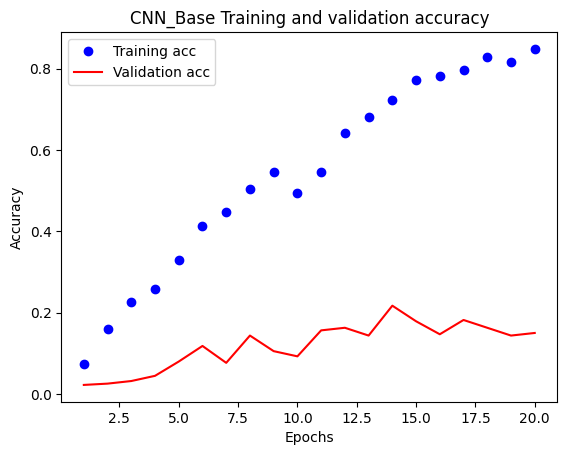

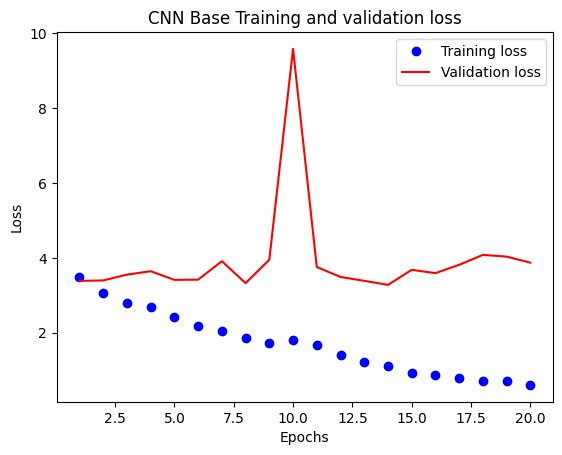

In [115]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('CNN_Base Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('CNN Base Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

So using less classes and implementing data augmentation improved the validation accuracy but only too 20% which is terrible so were going to use a skip model with augmentation.

# Skip model on augmented data


This will be a similar model to the one previously but with an added skip connection

In [116]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add, Flatten, Dense, Dropout, Input


def build_res_model(include_skip=True):
    model_input = Input(shape=(224, 224, 3))

    a = Conv2D(filters=16, kernel_size=(1, 1), padding='same')(model_input)
    a = BatchNormalization()(a)
    a = Activation('relu')(a)

    b = Conv2D(filters=16, kernel_size=(3, 3), padding='same')(a)
    b = BatchNormalization()(b)
    b = Activation('relu')(b)

    c = Conv2D(filters=16, kernel_size=(1, 1), padding='valid')(b)
    c = BatchNormalization()(c)
    c = Activation('relu')(c)

    if include_skip:
        ac = Add()([a, c])
    else:
        ac = c

    d = Conv2D(filters=32, kernel_size=(1, 1), strides=(2, 2), padding='same')(ac)
    d = BatchNormalization()(d)
    d = Activation('relu')(d)

    e = Conv2D(filters=32, kernel_size=(3, 3), padding='same')(d)
    e = BatchNormalization()(e)
    e = Activation('relu')(e)

    f = Conv2D(filters=32, kernel_size=(1, 1), padding='valid')(e)
    f = BatchNormalization()(f)
    f = Activation('relu')(f)

    if include_skip:
        df = Add()([d, f])
    else:
        df = f

    g = Conv2D(filters=64, kernel_size=(1, 1), strides=(2, 2), padding='same')(df)
    g = BatchNormalization()(g)
    g = Activation('relu')(g)

    h = Conv2D(filters=64, kernel_size=(3, 3), padding='same')(g)
    h = BatchNormalization()(h)
    h = Activation('relu')(h)

    i = Conv2D(filters=64, kernel_size=(1, 1), padding='valid')(h)
    i = BatchNormalization()(i)
    i = Activation('relu')(i)

    if include_skip:
        gi = Add()([g, i])
    else:
        gi = i

    x = Flatten()(gi)
    x = Dense(128)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(0.25)(x)
    x = Dense(30, activation='softmax')(x)

    return tf.keras.Model(inputs=model_input, outputs=x, name='res_model')


In [117]:
skip_model = build_res_model(True)


In [118]:
skip_model.summary()

Model: "res_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_13 (Conv2D)             (None, 224, 224, 16  64          ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_16 (BatchN  (None, 224, 224, 16  64         ['conv2d_13[0][0]']              
 ormalization)                  )                                                         

 ormalization)                                                                                    
                                                                                                  
 activation_24 (Activation)     (None, 56, 56, 64)   0           ['batch_normalization_24[0][0]'] 
                                                                                                  
 add_5 (Add)                    (None, 56, 56, 64)   0           ['activation_22[0][0]',          
                                                                  'activation_24[0][0]']          
                                                                                                  
 flatten_3 (Flatten)            (None, 200704)       0           ['add_5[0][0]']                  
                                                                                                  
 dense_11 (Dense)               (None, 128)          25690240    ['flatten_3[0][0]']              
          

In [119]:
skip_model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), metrics=['accuracy'])

In [120]:
history = skip_model.fit(training_set, validation_data=validation_set, epochs=20, callbacks=[tensorboard_callback])

Epoch 1/20
79/79 [==============================] - 24s 293ms/step - loss: 3.5469 - accuracy: 0.0606 - val_loss: 3.5364 - val_accuracy: 0.0192
Epoch 2/20
79/79 [==============================] - 23s 289ms/step - loss: 3.1572 - accuracy: 0.1185 - val_loss: 3.6337 - val_accuracy: 0.0256
Epoch 3/20
79/79 [==============================] - 23s 288ms/step - loss: 2.9521 - accuracy: 0.1607 - val_loss: 3.7162 - val_accuracy: 0.0288
Epoch 4/20
79/79 [==============================] - 23s 286ms/step - loss: 2.8105 - accuracy: 0.1935 - val_loss: 3.5360 - val_accuracy: 0.0543
Epoch 5/20
79/79 [==============================] - 23s 287ms/step - loss: 2.6800 - accuracy: 0.2413 - val_loss: 3.4983 - val_accuracy: 0.0735
Epoch 6/20
79/79 [==============================] - 23s 288ms/step - loss: 2.5760 - accuracy: 0.2637 - val_loss: 3.0677 - val_accuracy: 0.1629
Epoch 7/20
79/79 [==============================] - 23s 286ms/step - loss: 2.4667 - accuracy: 0.2796 - val_loss: 2.9564 - val_accuracy: 0.1853

In [121]:
# cache results 
skip_model.save('skip_model.h5')

with open('skip_model.json', 'w') as f:
        json.dump(history.history, f)

In [122]:
skip_model = tf.keras.models.load_model('skip_model.h5')
with open('skip_model.json') as f:
    skip_model_history = json.load(f)

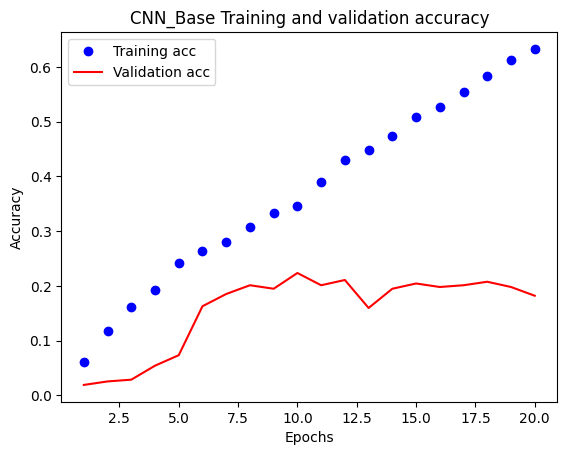

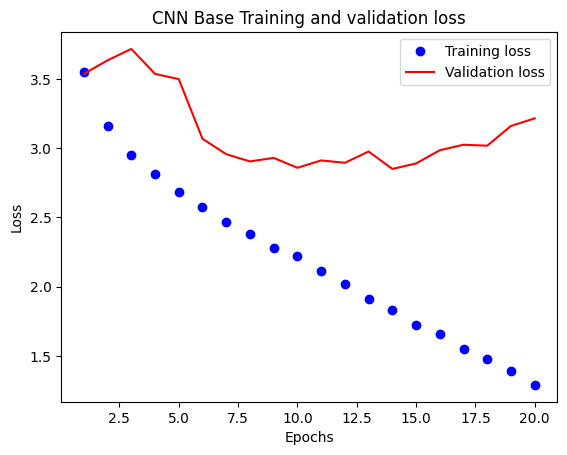

In [123]:
train_acc = skip_model_history['accuracy']
val_acc = skip_model_history['val_accuracy']
train_loss = skip_model_history['loss']
val_loss = skip_model_history['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('CNN_Base Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('CNN Base Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# Transfer Learning

## Transfer learning on 30% of data

In [194]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=NUM_CLASSES, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=30,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [195]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_13 (KerasLayer)  (None, 1001)             5432713   
                                                                 
 dense_18 (Dense)            (None, 30)                30060     
                                                                 
Total params: 5,462,773
Trainable params: 30,060
Non-trainable params: 5,432,713
_________________________________________________________________


In [204]:
# Build a function to train adn return a trained model
def train_model(): 
      """
      Trains a given model and returns the trained version.
      """
      # Create a model
      model = create_model()
      # Create new TensorBoard session everytime we train a model
      # Fit the model to the data passing it the callbacks we created
      history = model.fit(x=training_set,
                 epochs=10,
                 validation_data=validation_set,
                 validation_freq=1,
                callbacks=[tensorboard_callback])
      # Return the fitted model
      return model, history

In [205]:
transfer_30, history = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
79/79 [==============================] - 27s 304ms/step - loss: 1.3586 - accuracy: 0.6362 - val_loss: 0.4242 - val_accuracy: 0.8818
Epoch 2/10
79/79 [==============================] - 23s 288ms/step - loss: 0.3363 - accuracy: 0.8947 - val_loss: 0.3008 - val_accuracy: 0.9073
Epoch 3/10
79/79 [==============================] - 23s 285ms/step - loss: 0.2216 - accuracy: 0.9378 - val_loss: 0.2944 - val_accuracy: 0.8978
Epoch 4/10
79/79 [==============================] - 23s 286ms/step - loss: 0.1808 - accuracy: 0.9521 - val_loss: 0.2761 - val_accuracy: 0.9137
Epoch 5/10
79/79 [==============================] - 23s 285ms/step - loss: 0.1484 - accuracy: 0.9545 - val_loss: 0.2785 - val_accuracy: 0.9105
Epoch 6/10
79/79 [==============================] - 23s 291ms/step - loss: 0.1184 - accuracy: 0.9685 - val_loss: 0.2859 - val_accuracy: 0.9105
Epoch 7/10
79/79 [==============================]

In [206]:
# cache results 
transfer_30.save('transfer_30.h5')

with open('transfer_30.json', 'w') as f:
        json.dump(history.history, f)

In [207]:
transfer_30 = tf.keras.models.load_model(('transfer_30.h5'),
custom_objects={'KerasLayer':hub.KerasLayer})


with open('transfer_30.json') as f:
    my_reloaded_model = json.load(f)

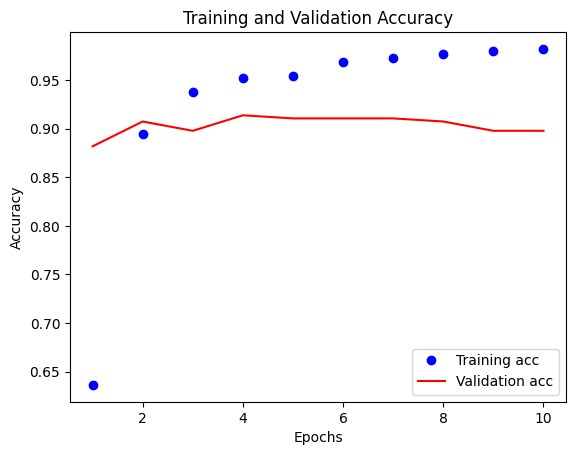

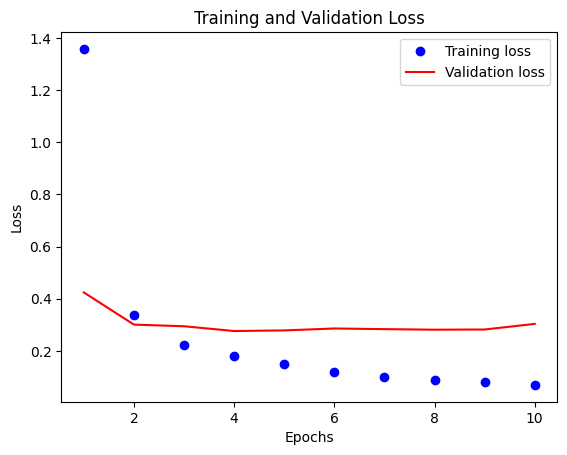

In [208]:
# Extract the training and validation accuracy and loss from the history
train_acc = my_reloaded_model['accuracy']
val_acc = my_reloaded_model['val_accuracy']
train_loss = my_reloaded_model['loss']
val_loss = my_reloaded_model['val_loss']

epochs = range(1, len(train_acc) + 1)

# Plotting training and validation accuracy
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

# Plotting training and validation loss
plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# Transfer learning on 50% data

### prepare 50% of data

In [20]:
filenames

['data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'data/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'data/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'data/dog-breed-identification/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'data/dog-breed-identification/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'data/dog-breed-identification/train/00693b8bc2470375cc744a6391d397ec.jpg',

In [21]:
fiftyfile = filenames[:5500] #this is my x and y values. 
fiftylab = labels[:5500]

In [22]:
X_train, X_test, y_train, y_test = train_test_split(fiftyfile, fiftylab, test_size=0.2, random_state=42) #only a train and test for last model


In [24]:
#onehot encode y values
y_train_encoded, y_test_encoded = apply_one_hot_encoding(y_train, y_test, include_valid=False)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
train_dataset, test_dataset = preprocess_datasets(X_train, y_train_encoded, X_test, y_test_encoded, data_aug=True)

In [26]:
train_dataset

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float64, name=None))>

## Data aug on 50% of data

In [28]:
#an early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

In [44]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=NUM_CLASSES, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=output_shape,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [45]:
# Build a function to train adn return a trained model
def train_model_full(): 
      """
      Trains a given model and returns the trained version.
      """
      # Create a model
      model = create_model()
      # Create new TensorBoard session everytime we train a model
      # Fit the model to the data passing it the callbacks we created
      history = model.fit(x=train_dataset,
                 epochs=10,
                 validation_data=test_dataset,
                 validation_freq=1,
                callbacks=[tensorboard_callback, early_stopping])
      # Return the fitted model
      return model, history

In [48]:
transfer_50, history = train_model_full()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
138/138 [==============================] - 28s 79ms/step - loss: 2.0566 - accuracy: 0.5368 - val_loss: 0.9205 - val_accuracy: 0.7445
Epoch 2/10
138/138 [==============================] - 24s 75ms/step - loss: 0.4846 - accuracy: 0.8736 - val_loss: 0.7902 - val_accuracy: 0.7673
Epoch 3/10
138/138 [==============================] - 25s 75ms/step - loss: 0.2661 - accuracy: 0.9411 - val_loss: 0.7827 - val_accuracy: 0.7782
Epoch 4/10
138/138 [==============================] - 25s 75ms/step - loss: 0.1663 - accuracy: 0.9698 - val_loss: 0.7819 - val_accuracy: 0.7755
Epoch 5/10
138/138 [==============================] - 25s 74ms/step - loss: 0.1152 - accuracy: 0.9841 - val_loss: 0.7745 - val_accuracy: 0.7745
Epoch 6/10
138/138 [==============================] - 25s 74ms/step - loss: 0.0844 - accuracy: 0.9900 - val_loss: 0.7823 - val_accuracy: 0.7827
Epoch 7/10
138/138 [=======================

In [49]:
# cache results 
transfer_50.save('transfer_50.h5')

with open('transfer_50.json', 'w') as f:
        json.dump(history.history, f)

In [50]:
transfer_50 = tf.keras.models.load_model(('transfer_50.h5'),
custom_objects={'KerasLayer':hub.KerasLayer})


with open('transfer_50.json') as f:
    my_reloaded_model_50 = json.load(f)

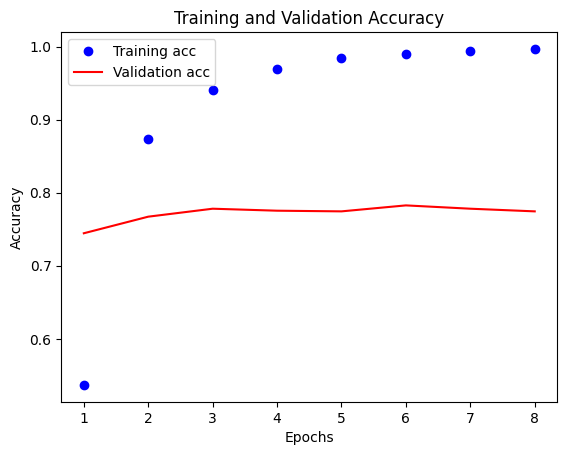

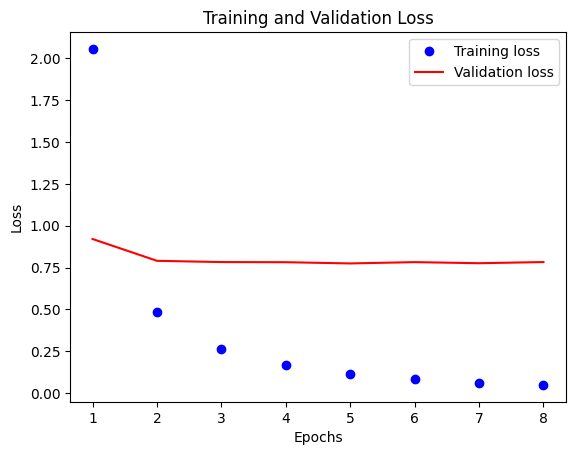

In [51]:
#Extract the training and validation accuracy and loss from history
train_acc = my_reloaded_model_50['accuracy']
val_acc = my_reloaded_model_50['val_accuracy']
train_loss = my_reloaded_model_50['loss']
val_loss = my_reloaded_model_50['val_loss']

epochs = range(1, len(train_acc) + 1)

#Plotting training and validation accuracy
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

#Plotting training and validation loss
plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# Evaluation

## Load models

In [21]:
transfer_50 = tf.keras.models.load_model(('transfer_50.h5'),
custom_objects={'KerasLayer':hub.KerasLayer})


with open('transfer_50.json') as f:
    my_reloaded_model_50 = json.load(f)
    

transfer_30 = tf.keras.models.load_model(('transfer_30.h5'),
custom_objects={'KerasLayer':hub.KerasLayer})


with open('transfer_30.json') as f:
    my_reloaded_model = json.load(f)
    
skip_model = tf.keras.models.load_model('skip_model.h5')
with open('skip_model.json') as f:
    skip_model_history = json.load(f)
    
cnn_aug = tf.keras.models.load_model('cnn_aug.h5')
with open('cnn_aug.json') as f:
    cnn_aug_history = json.load(f)
    
    
cnn1 = tf.keras.models.load_model('cnn1.h5')
with open('cnn1.json') as f:
    cnn1_history = json.load(f)
    
with open('best_random_forest_model.pkl', 'rb') as file:
    best_model = pickle.load(file)
    
with open('random_forest_model.pkl', 'rb') as file:
    rf_model = pickle.load(file)



## Dataset with 120 classes and 30% of data Evaluation with VGG16 feature engineering:


### RF model 1

In [33]:
from sklearn.metrics import classification_report, accuracy_score

y_pred = rf_model.predict(X_valid)
print("Accuracy:", accuracy_score(y_valid, y_pred))
print(classification_report(y_valid, y_pred))

Accuracy: 0.6459016393442623
                                precision    recall  f1-score   support

                  afghan_hound       1.00      1.00      1.00         3
           african_hunting_dog       1.00      1.00      1.00         2
                      airedale       0.62      1.00      0.77         5
american_staffordshire_terrier       0.00      0.00      0.00         1
            australian_terrier       1.00      0.40      0.57         5
                       basenji       0.40      1.00      0.57         4
                        basset       0.00      0.00      0.00         2
                        beagle       0.25      1.00      0.40         1
            bedlington_terrier       0.50      1.00      0.67         2
          bernese_mountain_dog       1.00      1.00      1.00         3
       black-and-tan_coonhound       0.00      0.00      0.00         0
              blenheim_spaniel       0.67      1.00      0.80         2
                    bloodhound    

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1

In [34]:
rf_model.score(X_train, y_train)

0.9995894909688013

In [39]:
accuracy_score(y_valid, y_pred)

0.6459016393442623

### rf model 2

In [53]:
with open('best_random_forest_model.pkl', 'rb') as file:
    best_model = pickle.load(file)

In [54]:
y_pred = best_model.predict(X_valid)

#Calculates accuracy
accuracy_best = accuracy_score(y_valid, y_pred)
print(f"Accuracy: {accuracy_best}")

#Print classification report
report = classification_report(y_valid, y_pred)
print(report)

Accuracy: 0.6426229508196721
                                precision    recall  f1-score   support

                 affenpinscher       0.00      0.00      0.00         0
                  afghan_hound       0.75      1.00      0.86         3
           african_hunting_dog       1.00      1.00      1.00         2
                      airedale       0.50      1.00      0.67         5
american_staffordshire_terrier       0.00      0.00      0.00         1
            australian_terrier       0.33      0.20      0.25         5
                       basenji       0.40      1.00      0.57         4
                        basset       1.00      0.50      0.67         2
                        beagle       0.33      1.00      0.50         1
            bedlington_terrier       0.40      1.00      0.57         2
          bernese_mountain_dog       1.00      1.00      1.00         3
       black-and-tan_coonhound       0.00      0.00      0.00         0
              blenheim_spaniel    

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1

In [50]:
best_model.score(X_train, y_train)

0.9995894909688013

In [55]:
accuracy_best

0.6426229508196721

## dataset with 120 classes and 30% of data without VGG16 feature engineering:

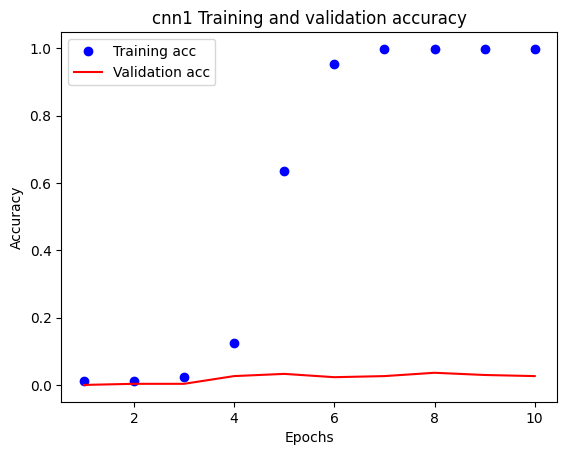

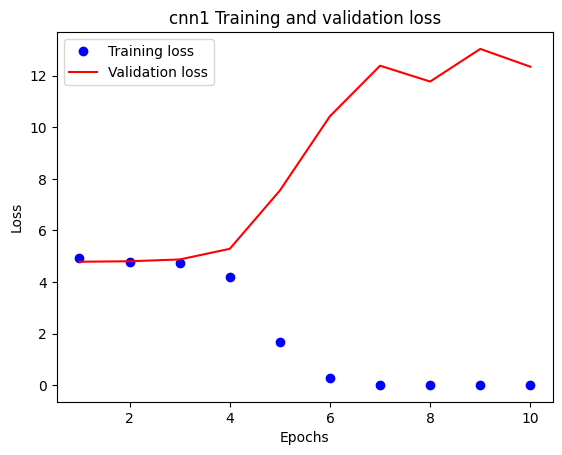

In [372]:
train_acc = cnn1_history['accuracy']
val_acc = cnn1_history['val_accuracy']
train_loss = cnn1_history['loss']
val_loss = cnn1_history['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('cnn1 Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('cnn1 Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()


In [94]:
training_loss = cnn1_history['loss'][-1]
training_accuracy = cnn1_history['accuracy'][-1]
print("Final Training Loss:", training_loss)
print("Final Training Accuracy:", training_accuracy)


Final Training Loss: 0.013477751053869724
Final Training Accuracy: 0.9979474544525146


In [93]:
validation_loss = cnn1_history['val_loss'][-1]
validation_accuracy = cnn1_history['val_accuracy'][-1]
print("Final Validation Loss:", validation_loss)
print("Final Validation Accuracy:", validation_accuracy)

Final Validation Loss: 12.348349571228027
Final Validation Accuracy: 0.026229508221149445


## Dataset with 30 classes and 30% of data evaluation:

## First augmented model

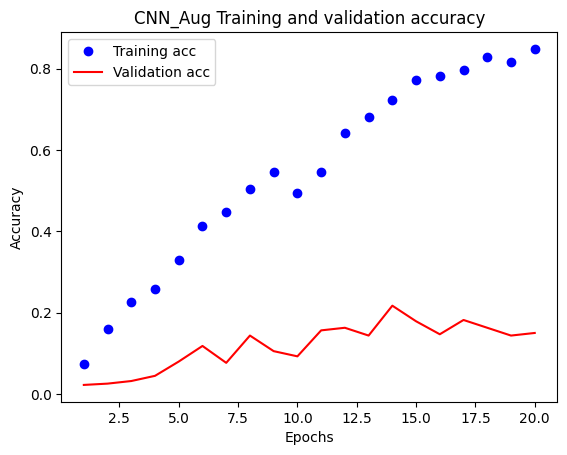

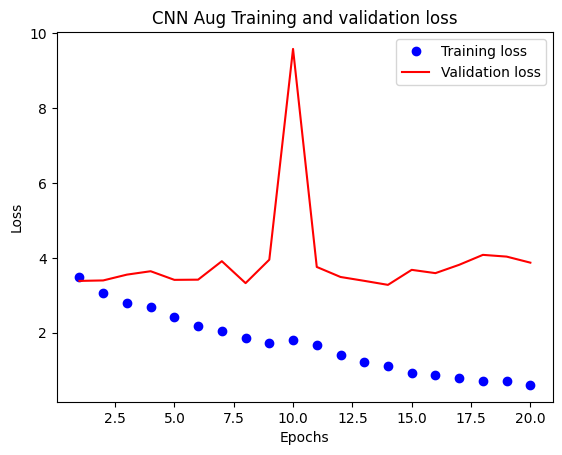

In [373]:
train_acc = cnn_aug_history['accuracy']
val_acc = cnn_aug_history['val_accuracy']
train_loss = cnn_aug_history['loss']
val_loss = cnn_aug_history['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('CNN_Aug Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('CNN Aug Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [103]:
training_loss1 = cnn_aug_history['loss'][-1]
training_accuracy1 = cnn_aug_history['accuracy'][-1]
print("Final Training Loss:", training_loss1)
print("Final Training Accuracy:", training_accuracy1)

Final Training Loss: 0.6048439741134644
Final Training Accuracy: 0.8488233089447021


In [104]:
validation_loss1 = cnn_aug_history['val_loss'][-1]
validation_accuracy1 = cnn_aug_history['val_accuracy'][-1]
print("Final Validation Loss:", validation_loss1)
print("Final Validation Accuracy:", validation_accuracy1)

Final Validation Loss: 3.8713157176971436
Final Validation Accuracy: 0.15015974640846252


## Skip model with aug

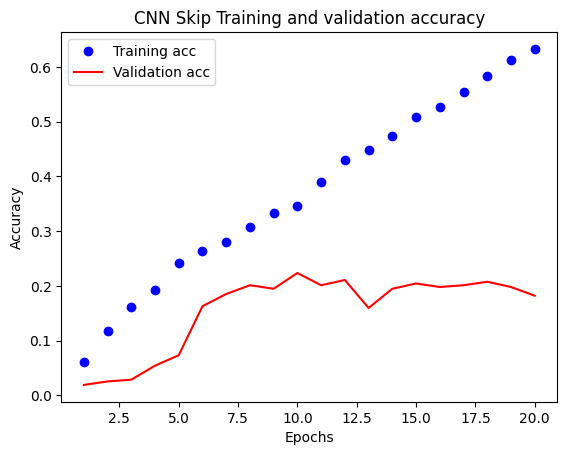

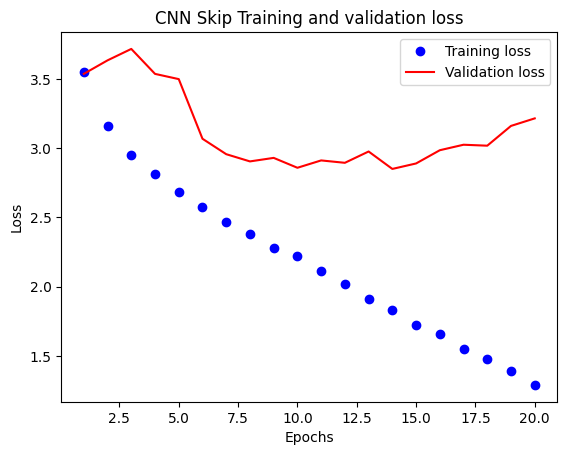

In [374]:
train_acc = skip_model_history['accuracy']
val_acc = skip_model_history['val_accuracy']
train_loss = skip_model_history['loss']
val_loss = skip_model_history['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('CNN Skip Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('CNN Skip Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [106]:
training_loss2 = skip_model_history['loss'][-1]
training_accuracy2 = skip_model_history['accuracy'][-1]
print("Final Training Loss:", training_loss2)
print("Final Training Accuracy:", training_accuracy2)

Final Training Loss: 1.2909058332443237
Final Training Accuracy: 0.6330274939537048


In [107]:
validation_loss2 = skip_model_history['val_loss'][-1]
validation_accuracy2 = skip_model_history['val_accuracy'][-1]
print("Final Validation Loss:", validation_loss2)
print("Final Validation Accuracy:", validation_accuracy2)

Final Validation Loss: 3.214780807495117
Final Validation Accuracy: 0.18210862576961517


## Transfer learning model

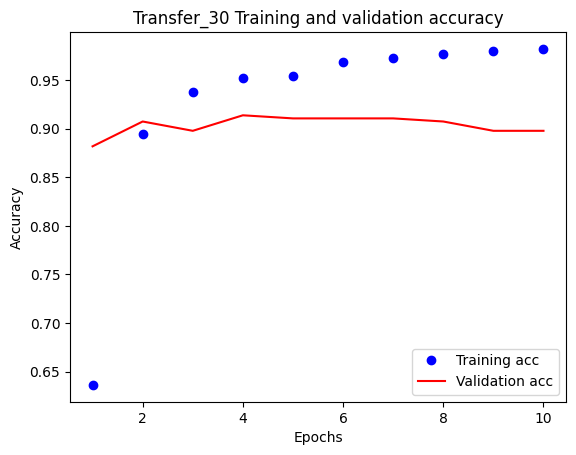

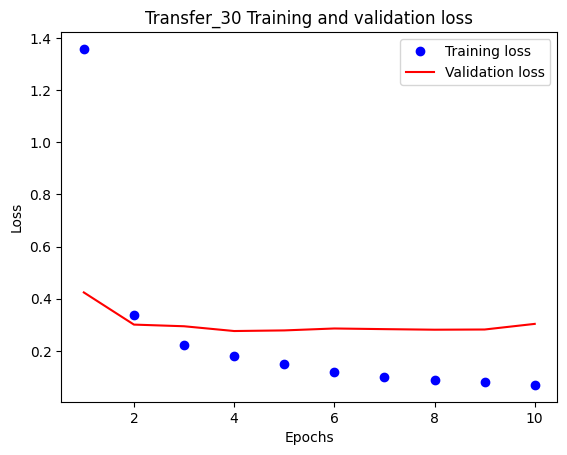

In [379]:
train_acc = my_reloaded_model['accuracy']
val_acc = my_reloaded_model['val_accuracy']
train_loss = my_reloaded_model['loss']
val_loss = my_reloaded_model['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Transfer_30 Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Transfer_30 Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [109]:
training_loss3 = my_reloaded_model['loss'][-1]
training_accuracy3 = my_reloaded_model['accuracy'][-1]
print("Final Training Loss:", training_loss3)
print("Final Training Accuracy:", training_accuracy3)

Final Training Loss: 0.06929411739110947
Final Training Accuracy: 0.9820502400398254


In [110]:
validation_loss3 = my_reloaded_model['val_loss'][-1]
validation_accuracy3 = my_reloaded_model['val_accuracy'][-1]
print("Final Validation Loss:", validation_loss3)
print("Final Validation Accuracy:", validation_accuracy3)

Final Validation Loss: 0.30351659655570984
Final Validation Accuracy: 0.8977635502815247


## Dataset with 120 classes and 50% of data evaluation:

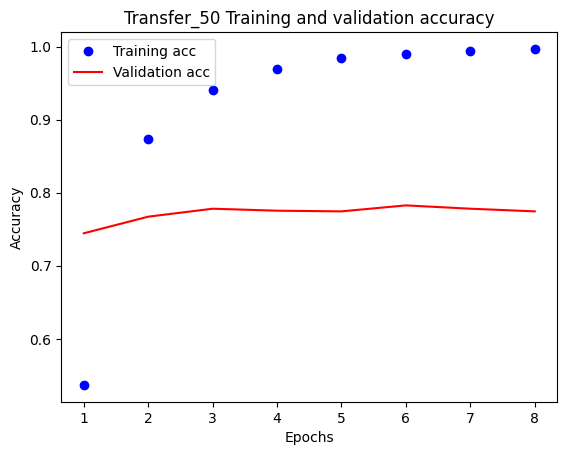

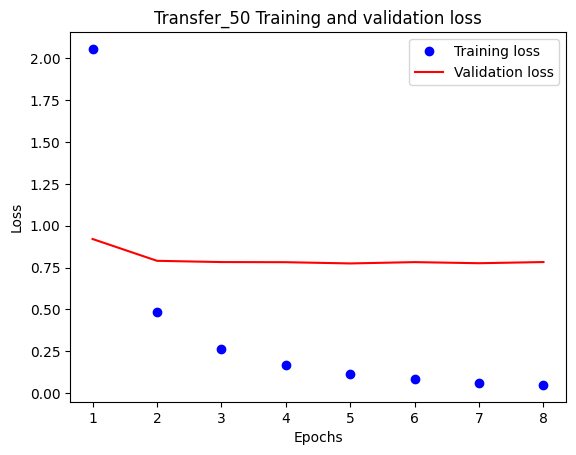

In [378]:
train_acc = my_reloaded_model_50['accuracy']
val_acc = my_reloaded_model_50['val_accuracy']
train_loss = my_reloaded_model_50['loss']
val_loss = my_reloaded_model_50['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Transfer_50 Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Transfer_50 Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [114]:
training_loss4 = my_reloaded_model_50['loss'][-1]
training_accuracy4 = my_reloaded_model_50['accuracy'][-1]
print("Final Training Loss:", training_loss4)
print("Final Training Accuracy:", training_accuracy4)

Final Training Loss: 0.048402611166238785
Final Training Accuracy: 0.9970454573631287


In [115]:
validation_loss4 = my_reloaded_model_50['val_loss'][-1]
validation_accuracy4 = my_reloaded_model_50['val_accuracy'][-1]
print("Final Validation Loss:", validation_loss4)
print("Final Validation Accuracy:", validation_accuracy4)

Final Validation Loss: 0.7827381491661072
Final Validation Accuracy: 0.774545431137085


# Tensorboard logs

In [7]:
pip install --upgrade protobuf


Requirement already up-to-date: protobuf in /usr/local/lib/python3.8/dist-packages (4.23.2)
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [5]:
%load_ext tensorboard

In [6]:
%tensorboard --logdir=logs/

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
Traceback (most recent call last):
  File "/usr/local/bin/tensorboard", line 5, in <module>
    from tensorboard.main import run_main
  File "/usr/local/lib/python3.8/dist-packages/tensorboard/main.py", line 27, in <module>
    from tensorboard import default
  File "/usr/local/lib/python3.8/dist-packages/tensorboard/default.py", line 33, in <module>
    from tensorboard.plugins.audio import audio_plugin
  File "/usr/local/lib/python3.8/dist-packages/tensorboard/plugins/audio/audio_plugin.py", line 25, in <module>
    from tensorboard.data import provider
  File "/usr/local/lib/python3.8/dist-packages/tensorboard/data/__init__.py", line 17, in <module>
    from tensorboard.data import experimental  # noqa: F401
  File "/usr/local/lib/python3.8/dist-packages/tensorboard/data/experimental/__init__.py", line 17, in <module>
    from tensorboard.data.experimental.experiment_from_dev import (  # noqa: F401
  File "/usr

# Making predictions

For this I'm going to use the transfer model that was on 50% of the data with all 120 classes. this will allow us to make predicts on all 120 breeds. 

In [27]:
predictions = transfer_50.predict(test_dataset, verbose=1)
predictions

35/35 [==============================] - 14s 302ms/step


array([[3.6819674e-05, 2.3697599e-07, 1.0266792e-05, ..., 6.9684946e-05,
        2.1828058e-04, 4.1788915e-08],
       [1.2445929e-06, 2.1734454e-07, 2.0442688e-07, ..., 1.6898181e-07,
        7.6652910e-08, 7.1407462e-09],
       [7.4358395e-06, 3.4376001e-08, 5.9515000e-03, ..., 1.1321083e-06,
        2.6724088e-05, 5.4070085e-07],
       ...,
       [1.4600781e-07, 3.7343217e-09, 1.3198331e-07, ..., 1.6513827e-07,
        1.7567476e-06, 6.7532739e-08],
       [7.9950305e-06, 8.4304622e-07, 3.6964432e-06, ..., 7.8972371e-06,
        1.7823630e-04, 1.0817245e-05],
       [2.7849308e-05, 1.7524023e-06, 9.3930872e-08, ..., 2.8569488e-08,
        6.4473896e-04, 2.5461272e-03]], dtype=float32)

In [28]:
np.sum(predictions[7])

0.99999994

In [130]:
# First prediction 
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.28101629e-09 5.60735134e-06 5.00162294e-08 1.83759187e-06
 2.01670773e-07 4.89580998e-07 2.28380763e-08 3.70782018e-08
 7.70850619e-08 1.10295474e-07 4.65065746e-08 3.65300536e-07
 4.70286468e-05 4.11358542e-07 2.20985676e-05 4.82819509e-08
 8.67583310e-07 4.88415799e-06 3.96579878e-07 3.41381567e-09
 6.66170497e-09 1.24382513e-08 3.28159786e-07 4.06894600e-07
 3.16811602e-05 2.32427659e-08 1.13421041e-08 5.17138794e-08
 4.98622074e-04 1.88874694e-09 1.85030231e-08 8.89772025e-08
 2.96237499e-06 1.92748573e-07 5.54034341e-06 1.47322578e-06
 1.23839891e-05 2.46745572e-07 8.51964188e-08 1.48570530e-06
 5.81058885e-06 7.10381940e-08 6.57488897e-07 1.72350001e-09
 4.13493108e-05 5.08505682e-09 3.21763345e-08 1.95651793e-07
 5.57493991e-07 9.97453630e-01 8.90004503e-06 3.89103505e-08
 2.31486638e-06 1.86264617e-06 2.54755772e-08 4.40748096e-08
 1.07423199e-04 2.67586933e-04 1.27770070e-08 3.32012701e-06
 9.49535561e-09 5.49884538e-09 1.22954469e-09 1.49892145e-07
 4.07172118e-09 7.357443

## Displaying the image the prediction is made on

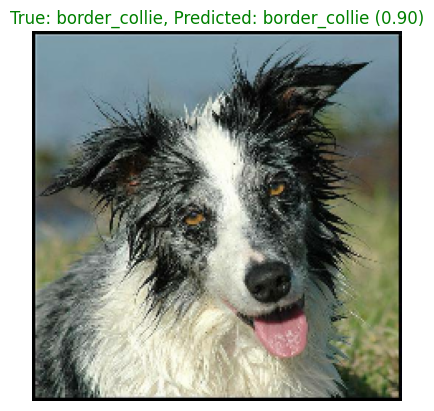

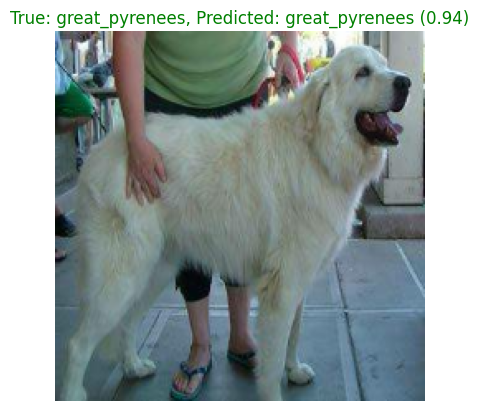

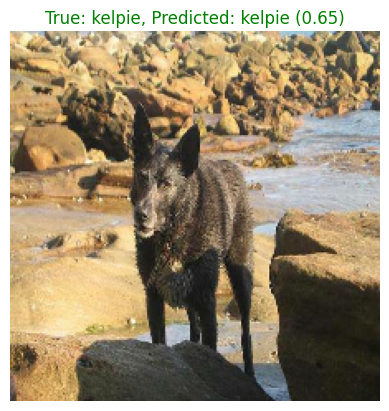

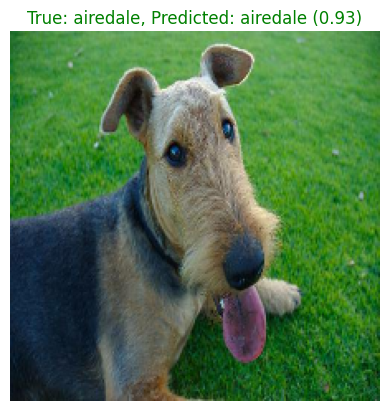

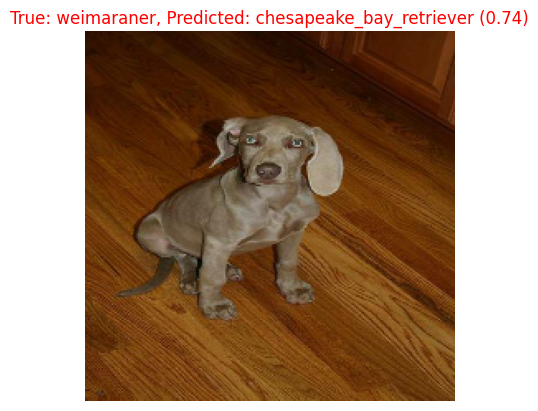

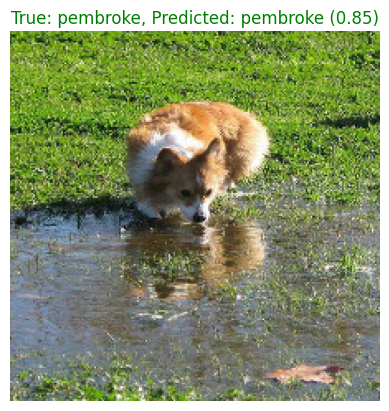

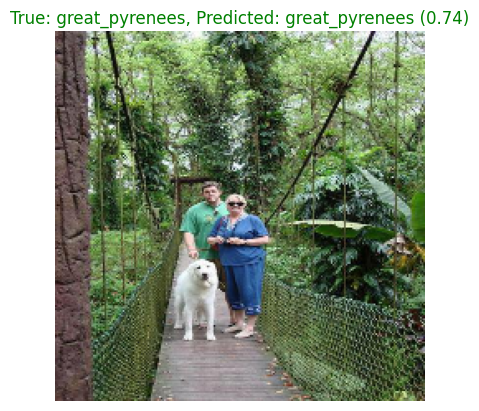

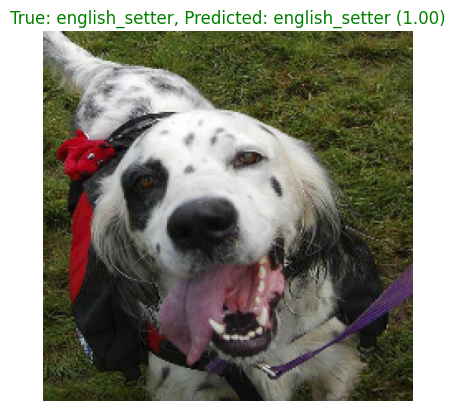

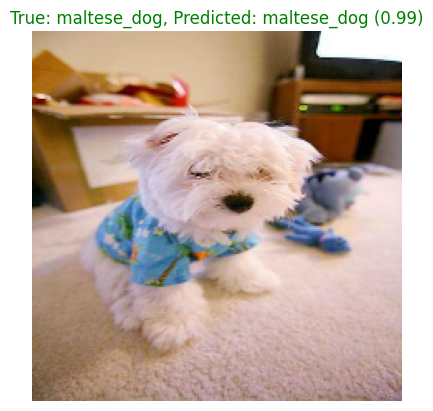

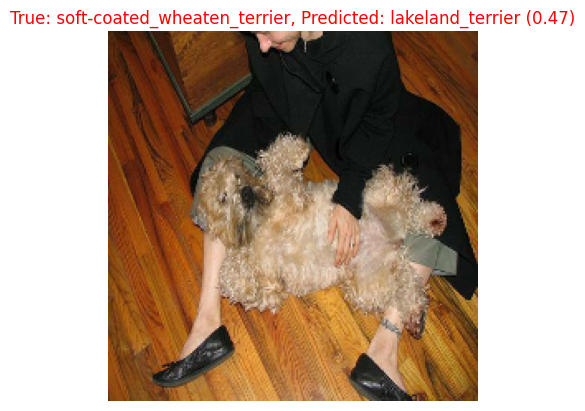

In [322]:
num_images = 10 #shows how many of the first images to display

#unbatch the test_data dataset
test_images = []
test_labels = []
for images, labels in test_dataset:
    test_images.extend(images)
    test_labels.extend(labels)


test_images = tf.convert_to_tensor(test_images)
test_labels = tf.convert_to_tensor(test_labels)

for i in range(min(num_images, len(test_images))):
    image = test_images[i]
    true_label = test_labels[i]
    predicted_prob = predictions[i]
    predicted_label_index = tf.argmax(predicted_prob).numpy()
    
    #Convert image to NumPy array
    image = image.numpy()

    plt.imshow(image)
    plt.axis('off')
    
    #get names and predictions probabilities
    true_label_indices = np.where(true_label == 1)[0]
    true_label_names = [unique_breeds[idx] for idx in true_label_indices]
    predicted_label_name = unique_breeds[predicted_label_index]
    predicted_prob_value = predicted_prob[predicted_label_index]
    
    #set titles true, predicted labels
    true_label_str = ', '.join(true_label_names)
    
    # Determine the font color based on prediction correctness
    font_color = 'green' if true_label_str == predicted_label_name else 'red'
    
    #set titles with font colours red for incorrect, green for correct.
    plt.title(f'True: {true_label_str}, Predicted: {predicted_label_name} ({predicted_prob_value:.2f})', color=font_color)

    plt.show()


In [70]:
!pip install seaborn

     |████████████████████████████████| 293 kB 21.2 MB/s eta 0:00:01
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


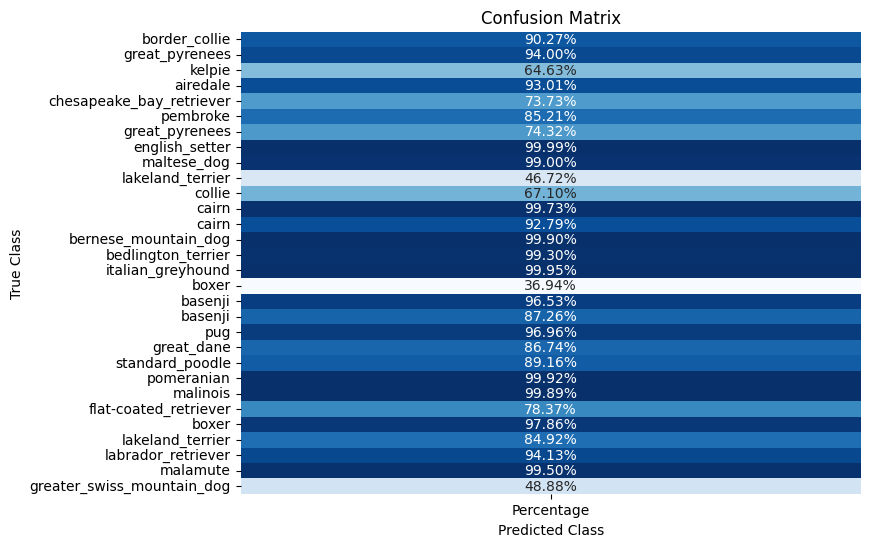

In [323]:
preds = []
classes = []

for i in range(0, 30):
    preds.append(np.max(predictions_30_samples[i]))   #gets first 30 predictions
    classes.append(unique_breeds[np.argmax(predictions[i])]) #gets first 30 classes


confusion_df = pd.DataFrame(preds, index=classes, columns=["Percentage"])


plt.figure(figsize=(8, 6))
sns.heatmap(confusion_df, annot=True, fmt='.2%', cmap='Blues', cbar=False)
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.title('Confusion Matrix')
plt.show()






In [324]:
# check our little graph
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.68196743e-05 2.36975993e-07 1.02667918e-05 1.97389340e-08
 3.54083409e-06 1.28845248e-04 1.63817342e-04 2.13540829e-07
 8.74171207e-08 1.12915977e-07 2.99284437e-07 1.52577577e-05
 5.16499874e-08 2.98800188e-07 8.72766304e-09 2.65903554e-06
 9.02687669e-01 2.11625803e-07 1.97067537e-04 1.84369143e-04
 1.07169754e-07 2.38740423e-08 8.52700794e-07 3.82416983e-05
 3.21665510e-07 2.14396834e-09 6.54025689e-06 2.96510174e-04
 1.14184253e-07 1.10141195e-06 1.41481351e-07 5.01565296e-07
 2.11553083e-06 9.03744996e-02 3.17035597e-06 1.28980980e-06
 8.64090168e-07 3.15047998e-07 8.16969350e-06 1.01196622e-06
 6.45736918e-06 1.20025934e-05 1.64423909e-05 1.31578713e-06
 1.32723057e-04 2.60777657e-08 5.97513235e-06 1.85201685e-07
 1.88114177e-06 3.16502701e-06 1.45297793e-06 1.02217598e-06
 6.02451746e-06 2.05395480e-07 2.13186082e-04 1.75938585e-05
 7.67893340e-08 6.15676868e-07 8.55004885e-08 1.94877895e-04
 1.10447487e-04 7.77135938e-05 3.02027584e-05 2.00449227e-04
 1.72407420e-06 2.636523

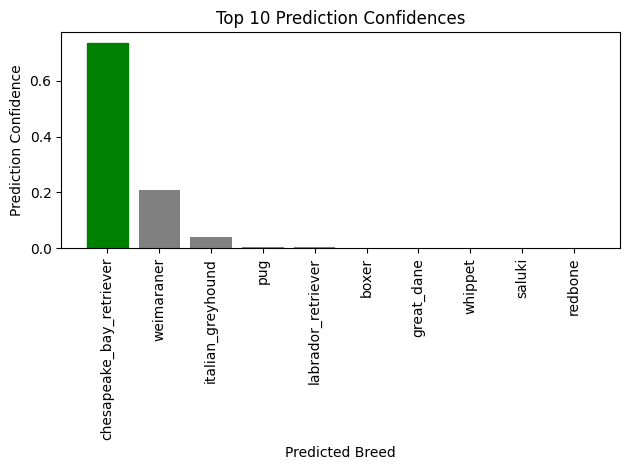

In [325]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plot the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    #Get predicted label
    pred_label = unique_breeds[np.argmax(pred_prob)]

    #Find prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    #find prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    top_10_pred_labels = np.array(unique_breeds)[top_10_pred_indexes]


    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")
    

    #change colour of label
    if np.isin(pred_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == pred_label)].set_color("green")
    else:
        pass

# Example usage
plot_pred_conf(predictions, test_labels, n=4)
plt.xlabel('Predicted Breed')
plt.ylabel('Prediction Confidence')
plt.title('Top 10 Prediction Confidences')
plt.tight_layout()
plt.show()




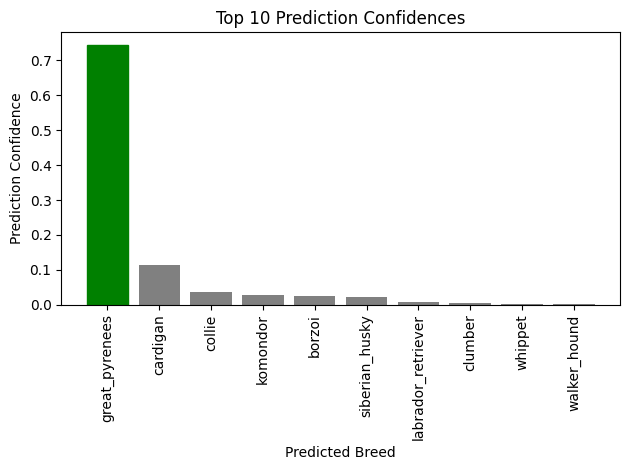

In [326]:
plot_pred_conf(predictions, test_labels, n=6)
plt.xlabel('Predicted Breed')
plt.ylabel('Prediction Confidence')
plt.title('Top 10 Prediction Confidences')
plt.tight_layout()
plt.show()


In [327]:
def display_image_with_prediction(prediction_probabilities, labels, images, n):
    """
    Display the image at the specified index along with its true label and predicted labels.
    """
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]
    pred_label = unique_breeds[np.argmax(pred_prob)]

    #Convert image to NumPy array
    image = images[n].numpy()

    plt.imshow(image)
    plt.axis('off')

    #get the true label name, predicted label and predicted probability
    true_label_indices = np.where(true_label == 1)[0]
    true_label_names = [unique_breeds[idx] for idx in true_label_indices]
    predicted_prob_value = pred_prob[np.argmax(pred_prob)]
    predicted_label_name = unique_breeds[np.argmax(pred_prob)]

    #Sets the titles, true and predicted label
    true_label_str = ', '.join(true_label_names)

    #shows font color based on prediction correctness
    font_color = 'green' if true_label_str == predicted_label_name else 'red'

    # Show results
    plt.title(f'True: {true_label_str}, Predicted: {predicted_label_name} ({predicted_prob_value:.2f})', color=font_color)

    plt.show()


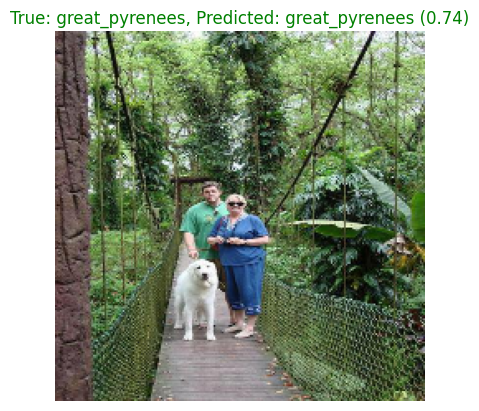

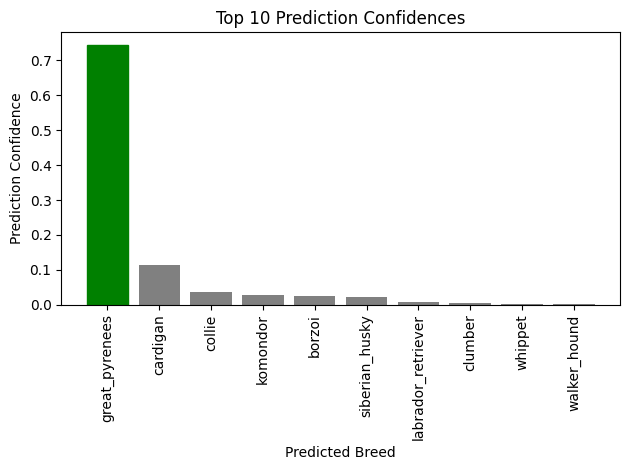

In [328]:
display_image_with_prediction(predictions, test_labels, test_images, n=6)

plot_pred_conf(predictions, test_labels, n=6)
plt.xlabel('Predicted Breed')
plt.ylabel('Prediction Confidence')
plt.title('Top 10 Prediction Confidences')
plt.tight_layout()
plt.show()



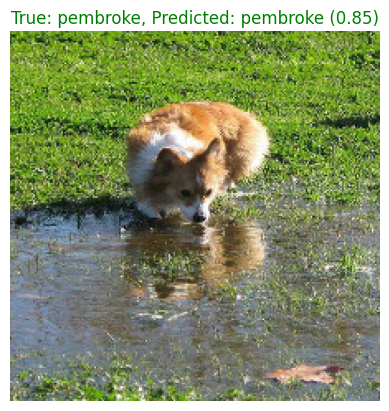

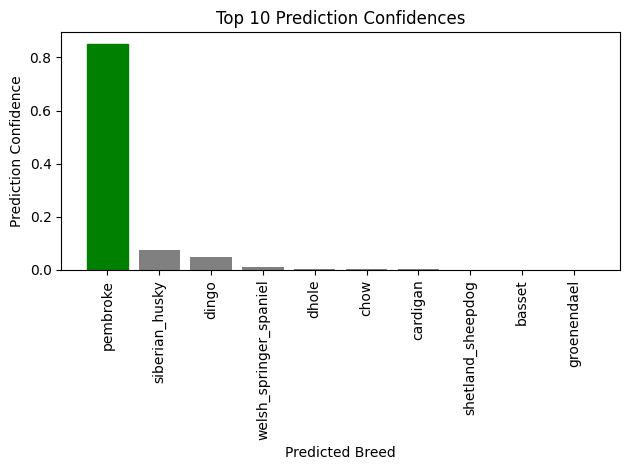

In [329]:
display_image_with_prediction(predictions, test_labels, test_images, n=5)

plot_pred_conf(predictions, test_labels, n=5)
plt.xlabel('Predicted Breed')
plt.ylabel('Prediction Confidence')
plt.title('Top 10 Prediction Confidences')
plt.tight_layout()
plt.show()


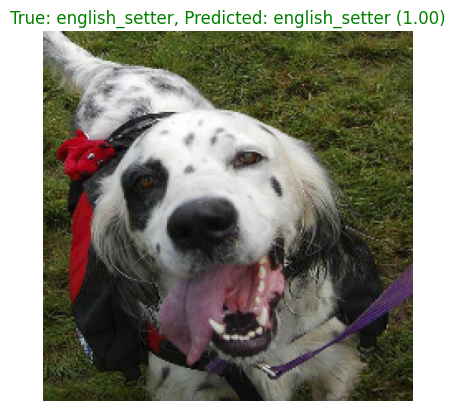

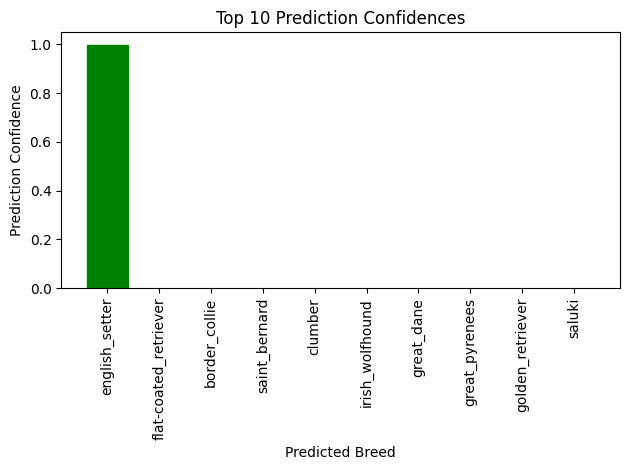

In [330]:
display_image_with_prediction(predictions, test_labels, test_images, n=7)

plot_pred_conf(predictions, test_labels, n=7)
plt.xlabel('Predicted Breed')
plt.ylabel('Prediction Confidence')
plt.title('Top 10 Prediction Confidences')
plt.tight_layout()
plt.show()


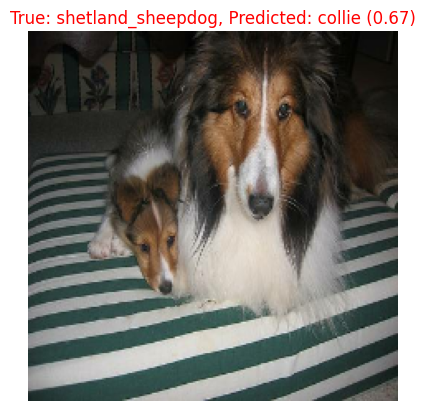

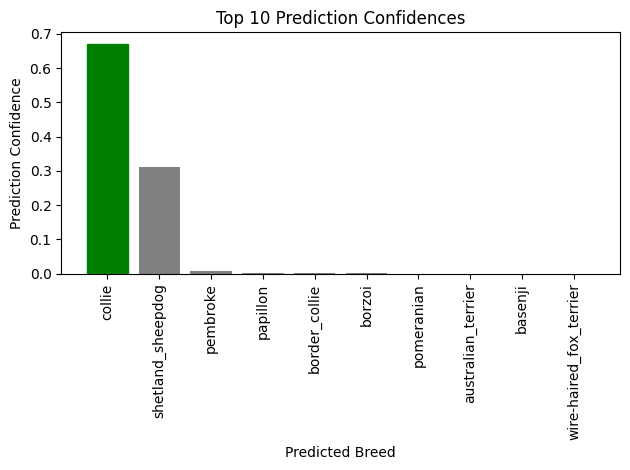

In [380]:
display_image_with_prediction(predictions, test_labels, test_images, n=10)

plot_pred_conf(predictions, test_labels, n=10)
plt.xlabel('Predicted Breed')
plt.ylabel('Prediction Confidence')
plt.title('Top 10 Prediction Confidences')
plt.tight_layout()
plt.show()


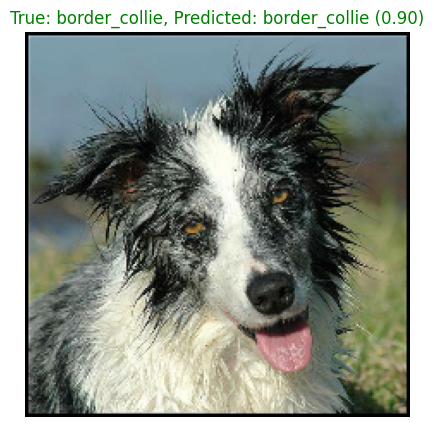

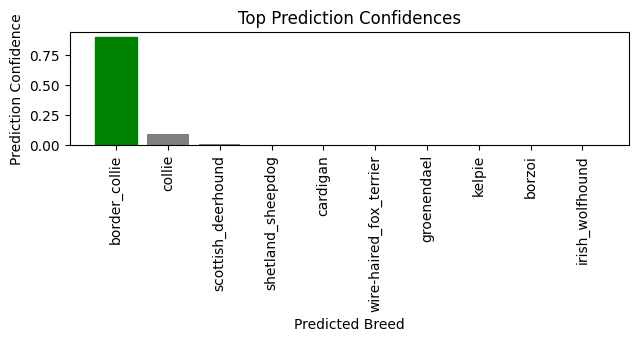

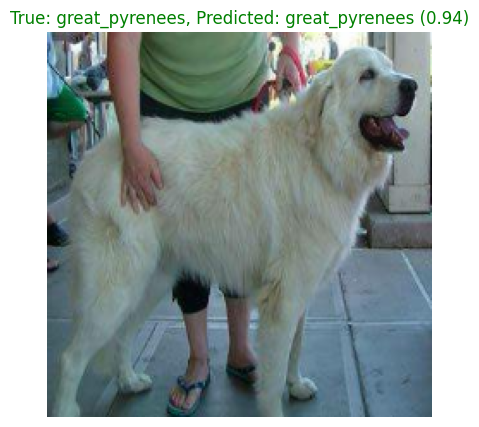

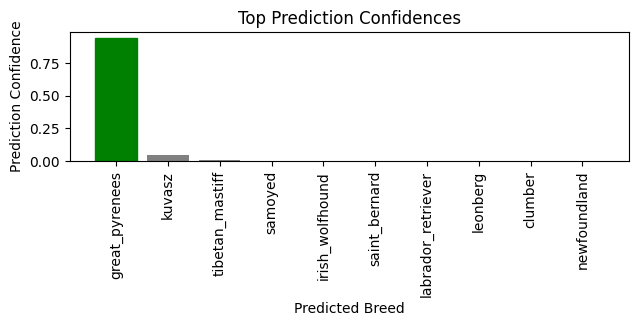

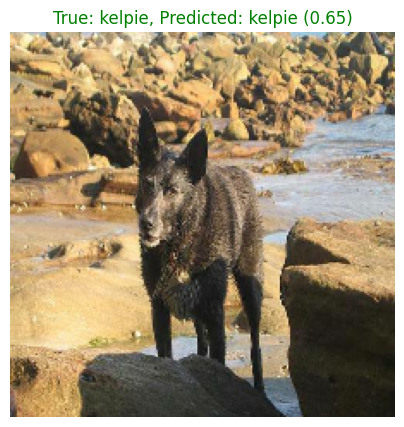

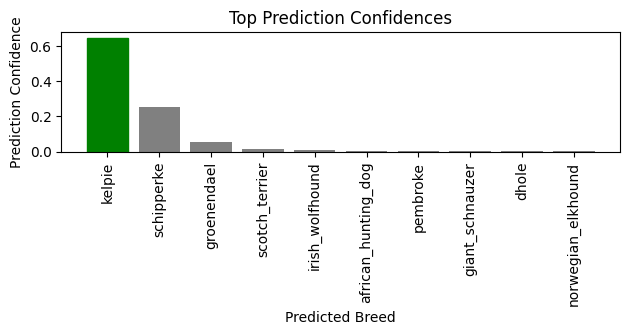

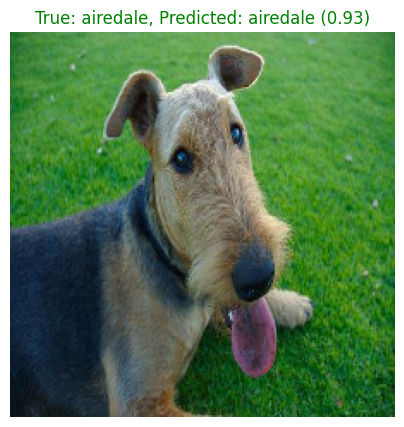

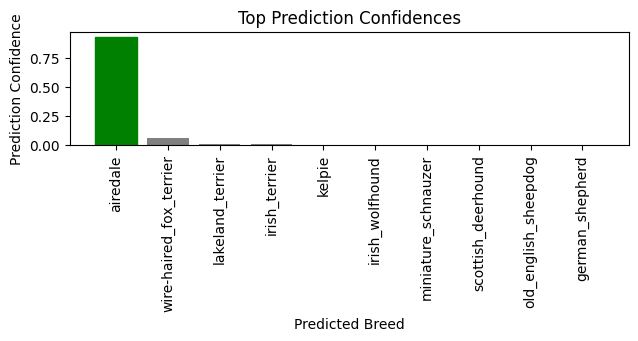

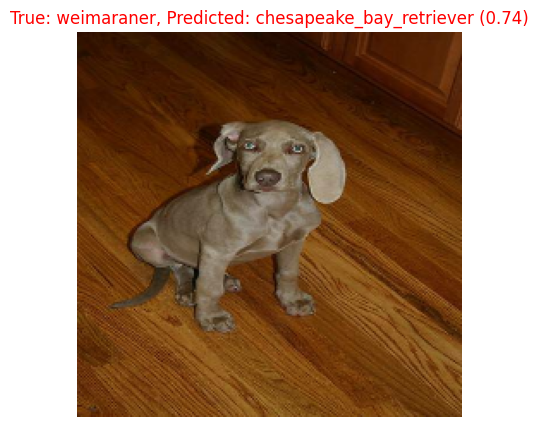

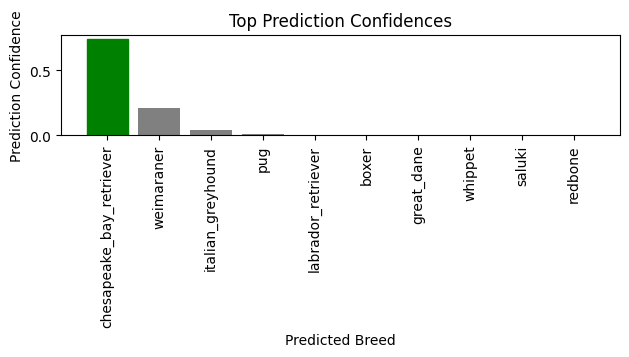

In [370]:
for n in range(0, 5):  #display the first five
    plt.figure(figsize=(5, 5))
    
    display_image_with_prediction(predictions, test_labels, test_images, n=n)
    
    plt.subplot(2, 1, 2)
    plot_pred_conf(predictions, test_labels, n=n)
    plt.xlabel('Predicted Breed')
    plt.ylabel('Prediction Confidence')
    plt.title('Top Prediction Confidences')
    
    plt.tight_layout()
    plt.show()






# Testing the model on my dog images

In [89]:
!unzip "C:\\Users\\Eavle\\Downloads\\my-dog-photos-20230615T090419Z-001\\my-dog-photos"

Archive:  C://Users//Eavle//Downloads//my-dog-photos-20230615T090419Z-001//my-dog-photos.zip
   creating: my-dog-photos/        
  inflating: my-dog-photos/05983D79-B08A-44F3-9652-D368313970D0.jpg  
  inflating: my-dog-photos/20170831_074716.jpg  
  inflating: my-dog-photos/59CE36BE-455D-4C2E-A8CE-8A2E58DFD911.jpg  
  inflating: my-dog-photos/992F33E5-C910-4B78-AD00-EC8BCE0ECFD7.jpg  
  inflating: my-dog-photos/AA8B90D9-B4B8-4BA3-A961-BAC4DD6F393F.jpg  
  inflating: my-dog-photos/C8BC9AF3-45D9-4344-AB84-334F7319DA72.jpg  
  inflating: my-dog-photos/CFC35631-416A-43AE-9A84-6552FFAC52A4.jpg  
  inflating: my-dog-photos/FF58FF99-621E-4A8C-90A7-A8B005B7CEDF.jpg  


In [25]:
ls

'Project TMA03.ipynb'           core.13                   skip_model.h5
 best_random_forest_model.pkl   data/                     skip_model.json
 cnn1.h5                        logs/                     transfer_30.h5
 cnn1.json                      model.pkl                 transfer_30.json
 cnn1.pkl                       my-dog-photos/            transfer_50.h5
 cnn_aug.h5                     my-dog-photos.zip         transfer_50.json
 cnn_aug.json                   random_forest_model.pkl


In [90]:
new_path = "my-dog-photos/"

In [91]:
custom_images = [new_path + fname for fname in os.listdir(new_path)]

In [92]:
custom_images

['my-dog-photos/05983D79-B08A-44F3-9652-D368313970D0.jpg',
 'my-dog-photos/20170831_074716.jpg',
 'my-dog-photos/59CE36BE-455D-4C2E-A8CE-8A2E58DFD911.jpg',
 'my-dog-photos/992F33E5-C910-4B78-AD00-EC8BCE0ECFD7.jpg',
 'my-dog-photos/AA8B90D9-B4B8-4BA3-A961-BAC4DD6F393F.jpg',
 'my-dog-photos/C8BC9AF3-45D9-4344-AB84-334F7319DA72.jpg',
 'my-dog-photos/CFC35631-416A-43AE-9A84-6552FFAC52A4.jpg',
 'my-dog-photos/FF58FF99-621E-4A8C-90A7-A8B005B7CEDF.jpg']

Batch the data

In [93]:
custom_dataset = tf.data.Dataset.from_tensor_slices(tf.constant(custom_images))

custom_dataset = custom_dataset.map(preprocess_image(data_aug=True))

custom_dataset = custom_dataset.batch(BATCH_SIZE)

In [94]:
custom_dataset

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [33]:
custom_preds = transfer_50.predict(custom_dataset)

In [38]:
#predictions probabilities with labels
for i, prediction in enumerate(custom_preds):
    image_path = custom_images[i]
    print(f"Image {image_path}:")
    top_predictions = sorted(range(len(prediction)), key=lambda i: prediction[i], reverse=True)
    for j in range(3):  # Display the top 3 predictions
        class_index = top_predictions[j]
        class_label = unique_breeds[class_index]
        probability = prediction[class_index]
        print(f"Class: {class_label}, Probability: {probability}")


Image my-dog-photos/59CE36BE-455D-4C2E-A8CE-8A2E58DFD911.jpg:
Class: beagle, Probability: 0.3278379738330841
Class: pug, Probability: 0.17158333957195282
Class: chihuahua, Probability: 0.16782189905643463
Image my-dog-photos/FF58FF99-621E-4A8C-90A7-A8B005B7CEDF.jpg:
Class: chihuahua, Probability: 0.931622326374054
Class: toy_terrier, Probability: 0.050568338483572006
Class: miniature_pinscher, Probability: 0.01352954376488924
Image my-dog-photos/C8BC9AF3-45D9-4344-AB84-334F7319DA72.jpg:
Class: chihuahua, Probability: 0.9989998936653137
Class: miniature_pinscher, Probability: 0.0008595272665843368
Class: pembroke, Probability: 4.748945138999261e-05
Image my-dog-photos/05983D79-B08A-44F3-9652-D368313970D0.jpg:
Class: scotch_terrier, Probability: 0.4957108199596405
Class: shih-tzu, Probability: 0.11816573143005371
Class: bernese_mountain_dog, Probability: 0.10369399935007095
Image my-dog-photos/CFC35631-416A-43AE-9A84-6552FFAC52A4.jpg:
Class: african_hunting_dog, Probability: 0.2955178618

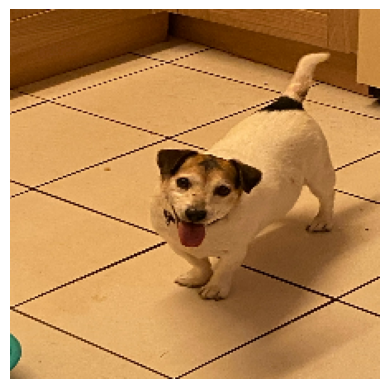

Predicted Class: beagle
Probability: 0.3278379738330841
---


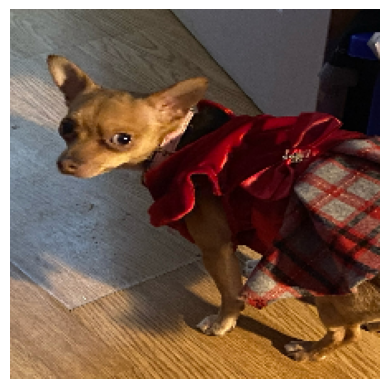

Predicted Class: chihuahua
Probability: 0.931622326374054
---


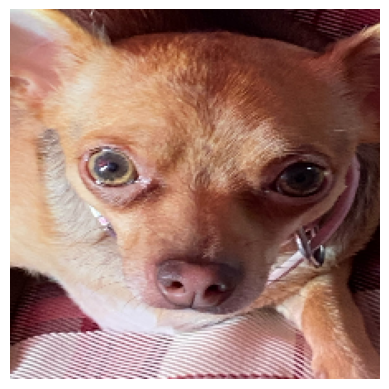

Predicted Class: chihuahua
Probability: 0.9962685108184814
---


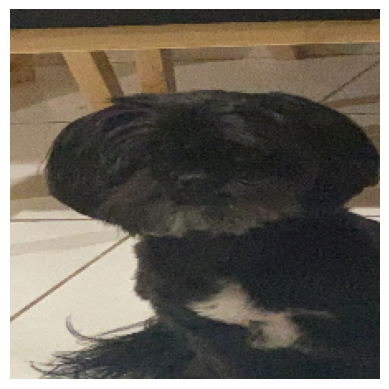

Predicted Class: lhasa
Probability: 0.2546021044254303
---


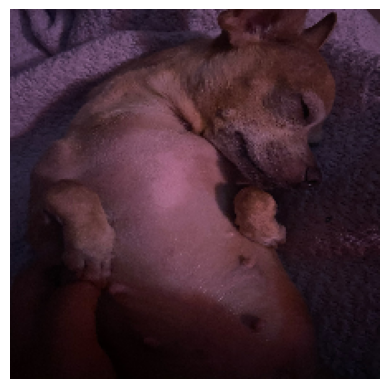

Predicted Class: african_hunting_dog
Probability: 0.29551786184310913
---


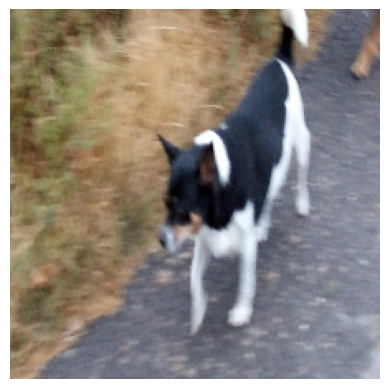

Predicted Class: appenzeller
Probability: 0.7457104325294495
---


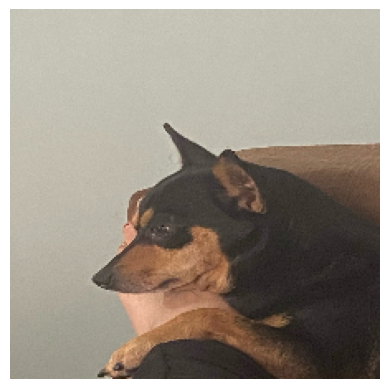

Predicted Class: miniature_pinscher
Probability: 0.8018770217895508
---


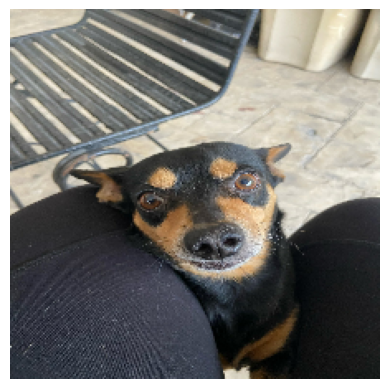

Predicted Class: miniature_pinscher
Probability: 0.9986932873725891
---


In [48]:
for batch_images in custom_dataset:
    #Perform predictions
    batch_preds = transfer_50.predict(batch_images)
    
    #analyze predictions for each image in batchs
    for i in range(batch_images.shape[0]):
        image = batch_images[i]
        prediction = batch_preds[i]
        
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        
        #predictions
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = unique_breeds[predicted_class_index]
        probability = prediction[predicted_class_index]
        
        print(f"Predicted Class: {predicted_class_label}")
        print(f"Probability: {probability}")
        print("---")


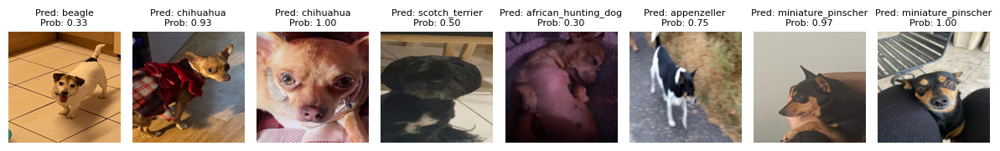

In [49]:
#grid dimensions
num_images = len(custom_images)
num_cols = 8
num_rows = (num_images - 1) // num_cols + 1


fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4))

#Flatten axes
if num_images < num_rows * num_cols:
    axes = axes.flatten()

#Iterate over images
for i, (image, prediction) in enumerate(zip(custom_images, custom_preds)):
    # Display the image in the corresponding subplot
    ax = axes[i]
    ax.imshow(image)
    ax.axis('off')
    
    #the prediction
    predicted_class_index = np.argmax(prediction)
    predicted_class_label = unique_breeds[predicted_class_index]
    probability = prediction[predicted_class_index]
    
    # Display the prediction as a title
    ax.set_title(f"Pred: {predicted_class_label}\nProb: {probability:.2f}", fontsize=8)
    
#Remove empty subplots
if num_images < num_rows * num_cols:
    for j in range(num_images, num_rows * num_cols):
        fig.delaxes(axes[j])


plt.tight_layout()

plt.show()


## New model on 100% of data

In [67]:
len(filenames), len(labels)

(10222, 10222)

In [68]:
allfiles = filenames #this is my x and y values. 
alllabels = labels

In [69]:
X_train, X_test, y_train, y_test = train_test_split(allfiles, alllabels, test_size=0.2, random_state=42) #only a train and test for last model

In [71]:
#onehot encode y values
y_train_encoded, y_test_encoded = apply_one_hot_encoding(y_train, y_test, include_valid=False)

C:\Users\Eavle\anaconda3\envs\dogproject\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
train_dataset, test_dataset = preprocess_datasets(X_train, y_train_encoded, X_test, y_test_encoded, data_aug=True)

In [79]:
transfer_100, history = train_model_full()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
256/256 [==============================] - 49s 107ms/step - loss: 1.4985 - accuracy: 0.6428 - val_loss: 0.7196 - val_accuracy: 0.7922
Epoch 2/10
256/256 [==============================] - 33s 63ms/step - loss: 0.4149 - accuracy: 0.8797 - val_loss: 0.6453 - val_accuracy: 0.8083
Epoch 3/10
256/256 [==============================] - 33s 62ms/step - loss: 0.2332 - accuracy: 0.9379 - val_loss: 0.6518 - val_accuracy: 0.8093
Epoch 4/10
256/256 [==============================] - 33s 62ms/step - loss: 0.1470 - accuracy: 0.9697 - val_loss: 0.6699 - val_accuracy: 0.8054
Epoch 5/10
256/256 [==============================] - 34s 63ms/step - loss: 0.1006 - accuracy: 0.9824 - val_loss: 0.6649 - val_accuracy: 0.8088


In [85]:
# cache results 
transfer_100.save('transfer_100.h5')

with open('transfer_100.json', 'w') as f:
        json.dump(history.history, f)

In [86]:
transfer_100 = tf.keras.models.load_model(('transfer_100.h5'),
custom_objects={'KerasLayer':hub.KerasLayer})


with open('transfer_100.json') as f:
    my_reloaded_model_100 = json.load(f)

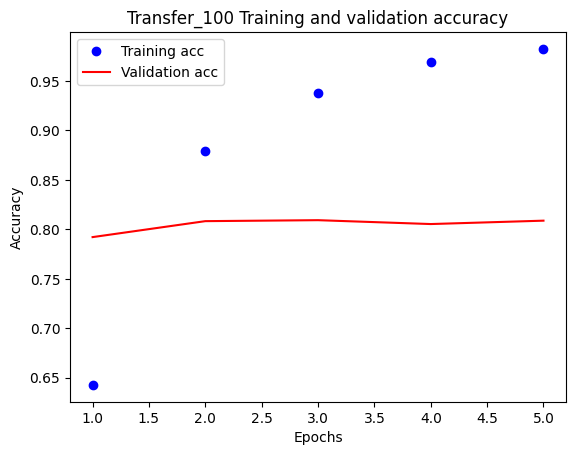

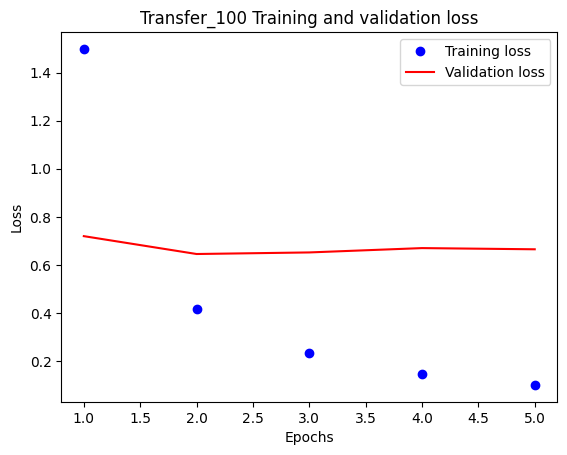

In [87]:
train_acc = my_reloaded_model_100['accuracy']
val_acc = my_reloaded_model_100['val_accuracy']
train_loss = my_reloaded_model_100['loss']
val_loss = my_reloaded_model_100['val_loss']

epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Transfer_100 Training and validation accuracy')
plt.legend()  # show legend
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Transfer_100 Training and validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [113]:
custom_preds = transfer_100.predict(custom_dataset)

In [96]:
#predictions probabilities with labels
for i, prediction in enumerate(custom_preds):
    image_path = custom_images[i]
    print(f"Image {image_path}:")
    top_predictions = sorted(range(len(prediction)), key=lambda i: prediction[i], reverse=True)
    for j in range(3):  # Display the top 3 predictions
        class_index = top_predictions[j]
        class_label = unique_breeds[class_index]
        probability = prediction[class_index]
        print(f"Class: {class_label}, Probability: {probability}")

Image my-dog-photos/05983D79-B08A-44F3-9652-D368313970D0.jpg:
Class: tibetan_mastiff, Probability: 0.43355265259742737
Class: pekinese, Probability: 0.34813204407691956
Class: bernese_mountain_dog, Probability: 0.07285026460886002
Image my-dog-photos/20170831_074716.jpg:
Class: toy_terrier, Probability: 0.7481421828269958
Class: kelpie, Probability: 0.05309758335351944
Class: cardigan, Probability: 0.05116887018084526
Image my-dog-photos/59CE36BE-455D-4C2E-A8CE-8A2E58DFD911.jpg:
Class: toy_terrier, Probability: 0.9837133884429932
Class: pug, Probability: 0.006207267753779888
Class: beagle, Probability: 0.0026087418664246798
Image my-dog-photos/992F33E5-C910-4B78-AD00-EC8BCE0ECFD7.jpg:
Class: miniature_pinscher, Probability: 0.9991150498390198
Class: toy_terrier, Probability: 0.0005316960159689188
Class: doberman, Probability: 8.322409121319652e-05
Image my-dog-photos/AA8B90D9-B4B8-4BA3-A961-BAC4DD6F393F.jpg:
Class: miniature_pinscher, Probability: 0.7514550685882568
Class: kelpie, Prob

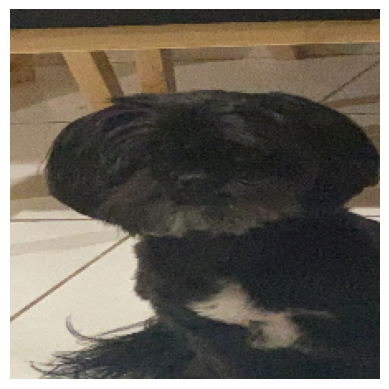

Predicted Class: tibetan_mastiff
Probability: 0.43355265259742737
---


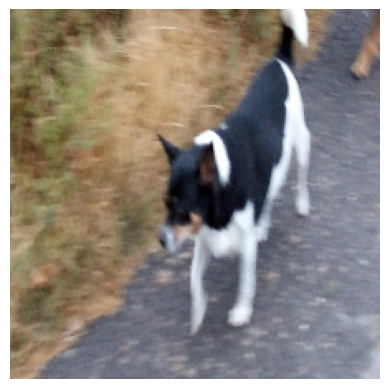

Predicted Class: toy_terrier
Probability: 0.7481421828269958
---


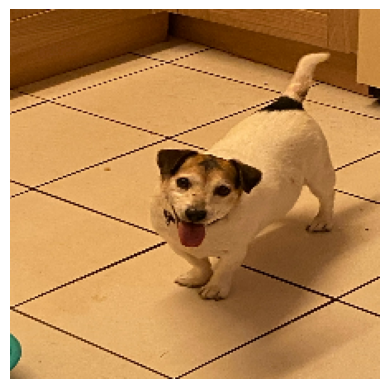

Predicted Class: toy_terrier
Probability: 0.9837133884429932
---


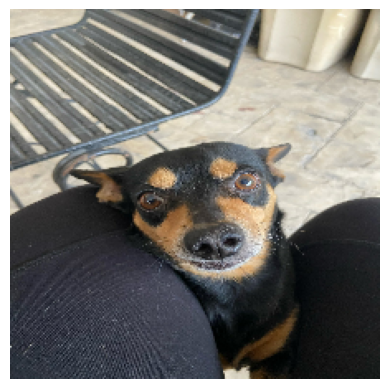

Predicted Class: miniature_pinscher
Probability: 0.9991150498390198
---


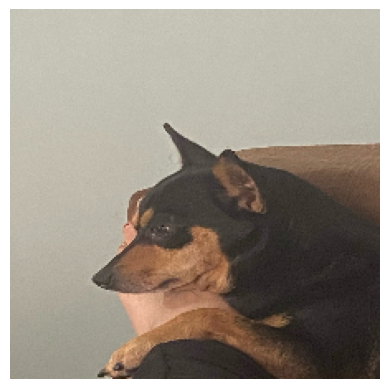

Predicted Class: miniature_pinscher
Probability: 0.7514550685882568
---


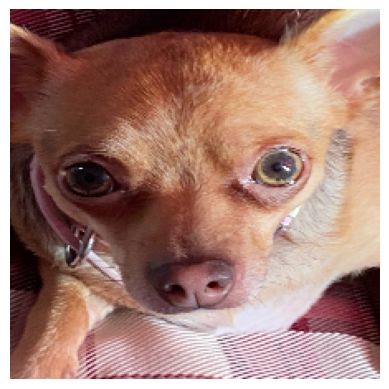

Predicted Class: chihuahua
Probability: 0.9861149787902832
---


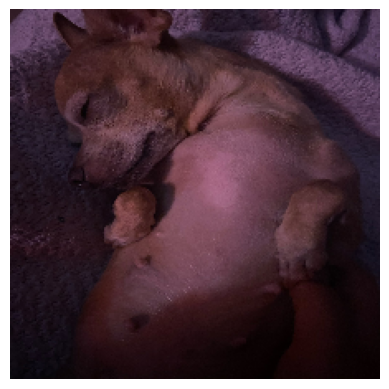

Predicted Class: mexican_hairless
Probability: 0.4677383303642273
---


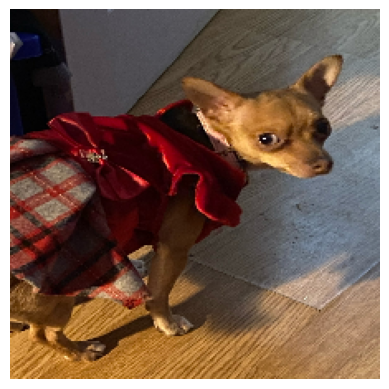

Predicted Class: chihuahua
Probability: 0.9077661633491516
---


In [97]:
for batch_images in custom_dataset:
    #Perform predictions
    batch_preds = transfer_100.predict(batch_images)
    
    #analyze predictions for each image in batchs
    for i in range(batch_images.shape[0]):
        image = batch_images[i]
        prediction = batch_preds[i]
        
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        
        #predictions
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = unique_breeds[predicted_class_index]
        probability = prediction[predicted_class_index]
        
        print(f"Predicted Class: {predicted_class_label}")
        print(f"Probability: {probability}")
        print("---")


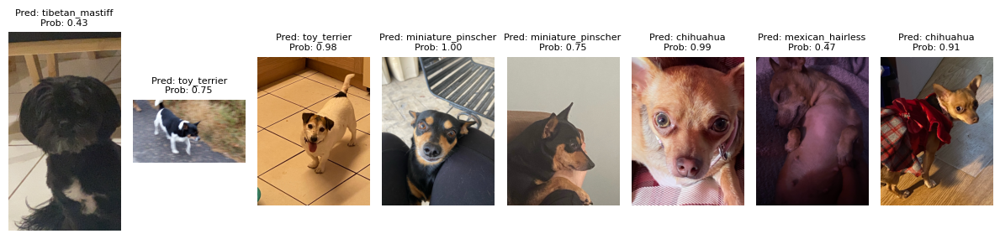

In [114]:
# Number of columns for the grid display
num_cols = 8
num_rows = (len(custom_images) - 1) // num_cols + 1

# Create the figure and axes for the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4))

# Flatten axes if there are fewer images than subplots
if len(custom_images) < num_rows * num_cols:
    axes = axes.flatten()

#Iterate over images and predictions
for i, (image_path, prediction) in enumerate(zip(custom_images, custom_preds)):
    # Load the image using matplotlib.image.imread
    image = mpimg.imread(image_path)

    # Display the image in the corresponding subplot
    ax = axes[i]
    ax.imshow(image)
    ax.axis('off')

    # Get the predicted class label and probability
    predicted_class_index = np.argmax(prediction)
    predicted_class_label = unique_breeds[predicted_class_index]
    probability = prediction[predicted_class_index]

    # Display the prediction as a title
    ax.set_title(f"Pred: {predicted_class_label}\nProb: {probability:.2f}", fontsize=8)

# Remove empty subplots
if len(custom_images) < num_rows * num_cols:
    for j in range(len(custom_images), num_rows * num_cols):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
